In [93]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import copy
import seaborn as sns
from scipy import stats
plt.style.use('seaborn')
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
import scipy.stats as st
from scipy import stats
from sklearn import datasets, linear_model
from sklearn.ensemble import VotingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
import xgboost as xgb
from xgboost import plot_importance, plot_tree
import sklearn
global df
from copy import deepcopy
np.set_printoptions(suppress=True)
from sklearn.ensemble import AdaBoostRegressor
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import warnings
warnings.filterwarnings('ignore')

In [94]:
global df_basel
df=pd.read_csv('basel.csv',delimiter=';')
df.rename(columns={"Temperature  [2 m above gnd]": "Temperature", "Relative Humidity  [2 m above gnd]": "RelativeHumidity",'Mean Sea Level Pressure  [MSL]': "MeanSeaLevelPressure",'Total Precipitation (high resolution)  [sfc]':"TotalPrecipationhigh",'Total Precipitation (low resolution)  [sfc]':'TotalPrecipationlow','Snowfall Amount (high resolution)  [sfc]':'SnowfallAmounthigh','Snowfall Amount (low resolution)  [sfc]':'SnowfallAmountlow','Total Cloud Cover  [sfc]':'TotalCloudCover','High Cloud Cover  [high cld lay]':'HighCloudCover','Medium Cloud Cover  [mid cld lay]':'MediumCloudCover','Low Cloud Cover  [low cld lay]':'LowCloudCover','Sunshine Duration  [sfc]':'SunshineDuration','Shortwave Radiation  [sfc]':'ShortwaveRadiation','Wind Speed  [10 m above gnd]':'WindSpeed10','Wind Direction  [10 m above gnd]':'WindDirection10','Wind Speed  [80 m above gnd]':'WindSpeed80','Wind Direction  [80 m above gnd]':'WindDirection80','Wind Speed  [900 mb]':'WindSpeed900','Wind Direction  [900 mb]':'WindDirection900','Wind Gust  [sfc]':'WindGust'},inplace=True)


df['Temperature_shift'] = df['Temperature'] - df['Temperature'].shift(1)
df['mean_temp']=df['Temperature'].rolling(240).mean()
df['std'] = df['Temperature'].rolling(12).std()
df['mean_4']=df['Temperature'].rolling(1200).mean()
#df['detrend']=df['Temperature'] - df['Temperature'].rolling(8760).mean()

In [95]:
len(df)

306984

In [96]:
df.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature',
       'RelativeHumidity', 'MeanSeaLevelPressure', 'TotalPrecipationhigh',
       'TotalPrecipationlow', 'SnowfallAmounthigh', 'SnowfallAmountlow',
       'TotalCloudCover', 'HighCloudCover', 'MediumCloudCover',
       'LowCloudCover', 'SunshineDuration', 'ShortwaveRadiation',
       'WindSpeed10', 'WindDirection10', 'WindSpeed80', 'WindDirection80',
       'WindSpeed900', 'WindDirection900', 'WindGust', 'Temperature_shift',
       'mean_temp', 'std', 'mean_4'],
      dtype='object')

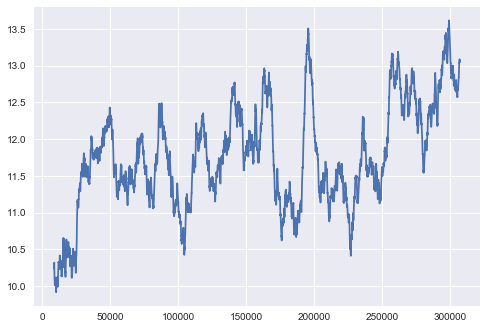

In [97]:
df['Temperature'].rolling(8760).mean().plot()

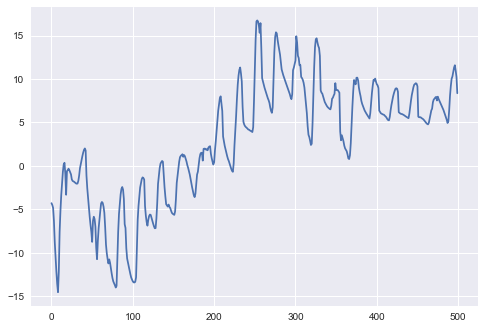

In [98]:
df['Temperature'][:500].plot()

In [99]:
df=df[8760:]

In [100]:
df_basel=df

In [53]:
df.columns


Index(['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature',
       'RelativeHumidity', 'MeanSeaLevelPressure', 'TotalPrecipationhigh',
       'TotalPrecipationlow', 'SnowfallAmounthigh', 'SnowfallAmountlow',
       'TotalCloudCover', 'HighCloudCover', 'MediumCloudCover',
       'LowCloudCover', 'SunshineDuration', 'ShortwaveRadiation',
       'WindSpeed10', 'WindDirection10', 'WindSpeed80', 'WindDirection80',
       'WindSpeed900', 'WindDirection900', 'WindGust', 'Temperature_shift',
       'mean_temp', 'std', 'mean_4'],
      dtype='object')

In [39]:
#df['detrend'][:500].plot()

In [12]:
df.head()

,Year,Month,Day,Hour,Minute,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalPrecipationhigh,TotalPrecipationlow,...,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust,Temperature_shift,mean_temp,std,mean_4,detrend
8760,1986,2,16,0,0,1.84,94.0,1009.2,NaN,0.0,...,3.96,198.81,7.19,259.48,5.40,0.03,-3.584750,0.820344,0.921383,-8.398289
8761,1986,2,16,1,0,1.85,94.0,1009.2,NaN,0.0,...,3.61,194.99,7.12,263.75,5.40,0.01,-3.574292,0.862402,0.918908,-8.389015
8762,1986,2,16,2,0,1.84,95.0,1009.1,NaN,0.0,...,3.54,189.63,6.35,265.43,5.04,-0.01,-3.563125,0.852606,0.916442,-8.399779
8763,1986,2,16,3,0,2.04,97.0,1009.0,NaN,0.0,...,3.23,178.38,5.98,265.14,5.04,0.20,-3.550792,0.731463,0.914192,-8.200735
8764,1986,2,16,4,0,2.10,95.0,1008.6,NaN,0.0,...,2.94,157.65,5.22,267.39,4.68,0.06,-3.537875,0.535664,0.912108,-8.141974


In [7]:
X = df['Temperature'].values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -14.465709
p-value: 0.000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


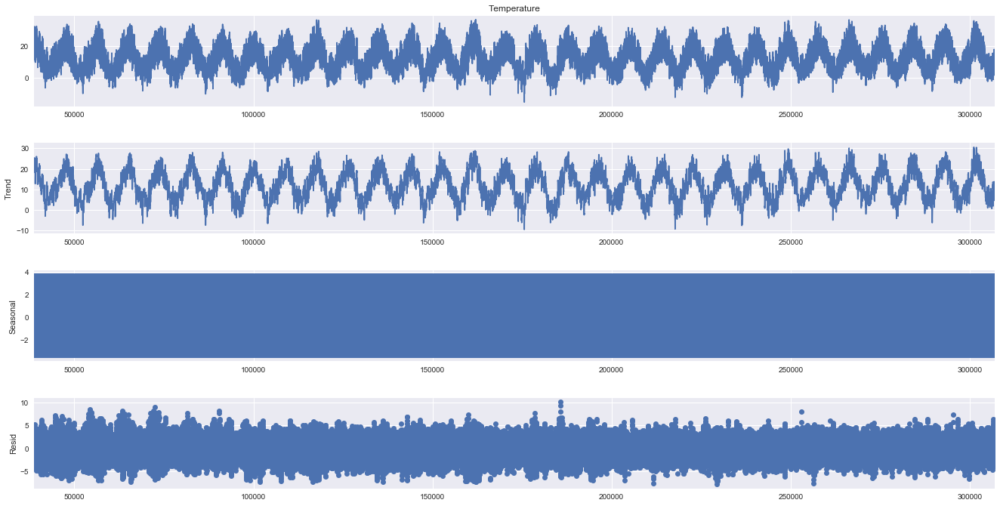

In [11]:
df['Temperature'][30000:]

38760     12.52
38761     12.19
38762     12.17
38763     12.09
38764     11.77
          ...  
306979    14.16
306980    13.72
306981    13.01
306982    12.60
306983    12.02
Name: Temperature, Length: 268224, dtype: float64

In [63]:
df_basel.head()

,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalCloudCover,LowCloudCover,SunshineDuration,ShortwaveRadiation,WindSpeed10,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust,Temperature_shift,mean_temp,std,mean_4
date,,,,,,,,,,,,,,,,,,
1986-02-16 00:00:00,1.84,94.0,1009.2,100.0,100.0,0.0,0.0,2.19,184.42,3.96,198.81,7.19,259.48,5.40,0.03,-3.584750,0.820344,0.921383
1986-02-16 01:00:00,1.85,94.0,1009.2,100.0,100.0,0.0,0.0,2.19,175.65,3.61,194.99,7.12,263.75,5.40,0.01,-3.574292,0.862402,0.918908
1986-02-16 02:00:00,1.84,95.0,1009.1,100.0,100.0,0.0,0.0,2.34,159.04,3.54,189.63,6.35,265.43,5.04,-0.01,-3.563125,0.852606,0.916442
1986-02-16 03:00:00,2.04,97.0,1009.0,100.0,100.0,0.0,0.0,2.28,138.69,3.23,178.38,5.98,265.14,5.04,0.20,-3.550792,0.731463,0.914192
1986-02-16 04:00:00,2.10,95.0,1008.6,100.0,100.0,0.0,0.0,2.22,124.05,2.94,157.65,5.22,267.39,4.68,0.06,-3.537875,0.535664,0.912108


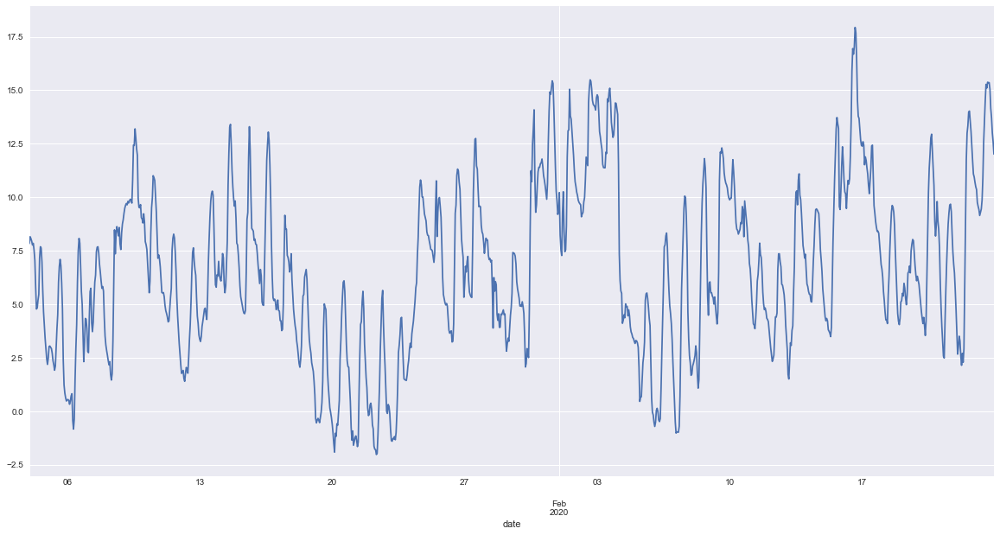

In [67]:
plt.figure(figsize = (20,10))
df_basel['Temperature'][297000:].plot()

In [21]:
df['date'] = pd.to_datetime(df[['Year', 'Month', 'Day', 'Hour', 'Minute']])
df.drop(['Year', 'Month', 'Day', 'Hour', 'Minute'],axis=1,inplace=True)
df.set_index('date',inplace=True)
df.drop([df.columns[3],df.columns[4],df.columns[5],df.columns[6],df.columns[8],df.columns[9]], axis=1,inplace=True)

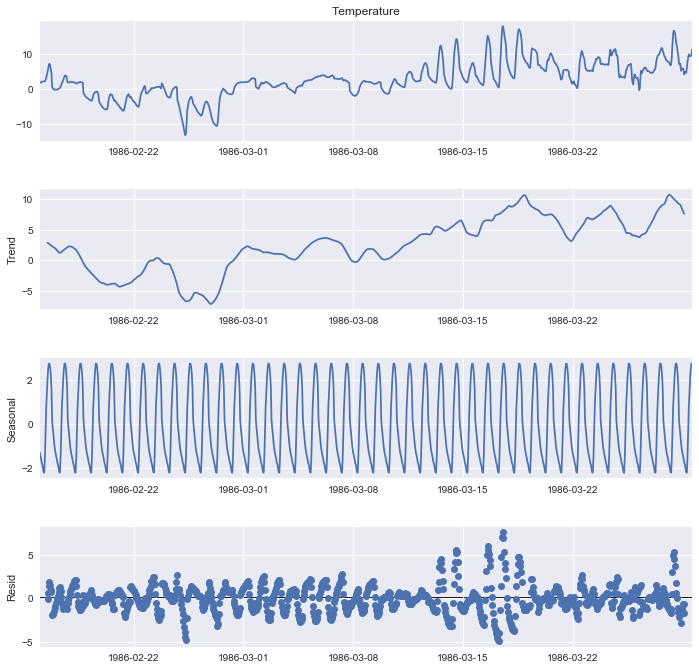

In [18]:
result = seasonal_decompose(df['Temperature'][:1000], model='additive',period=24)
fig=result.plot()

fig.set_figheight(10)
fig.set_figwidth(10)
plt.show()

In [125]:
a=result.seasonal+result.trend

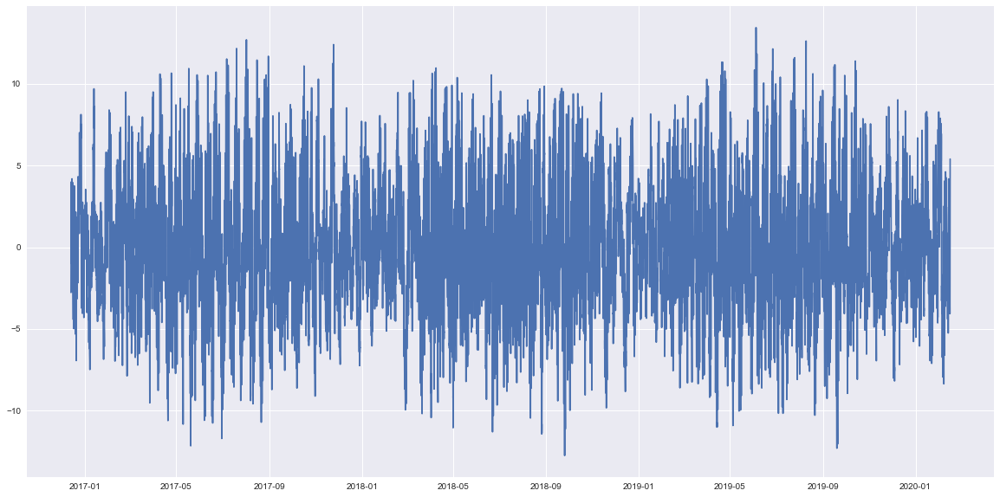

In [126]:
plt.figure(figsize = (20,10))
#plt.plot(df['Temperature'][295000:])
plt.plot(df['Temperature'][270000:]-result.trend)

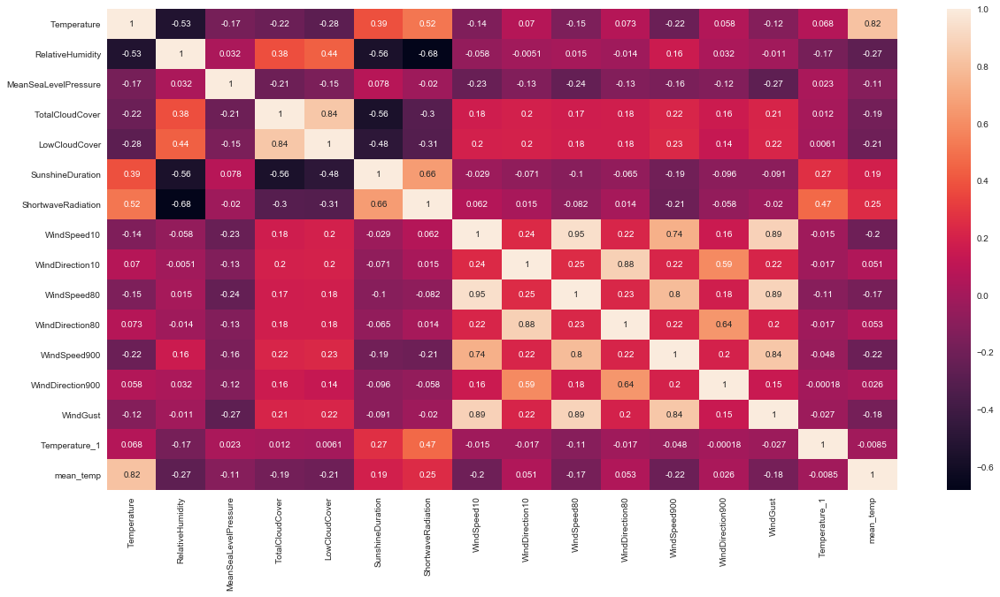

In [12]:
corrMatrix = df.corr(method='pearson')
plt.figure(figsize = (20,10))
sns.heatmap(corrMatrix, annot=True)

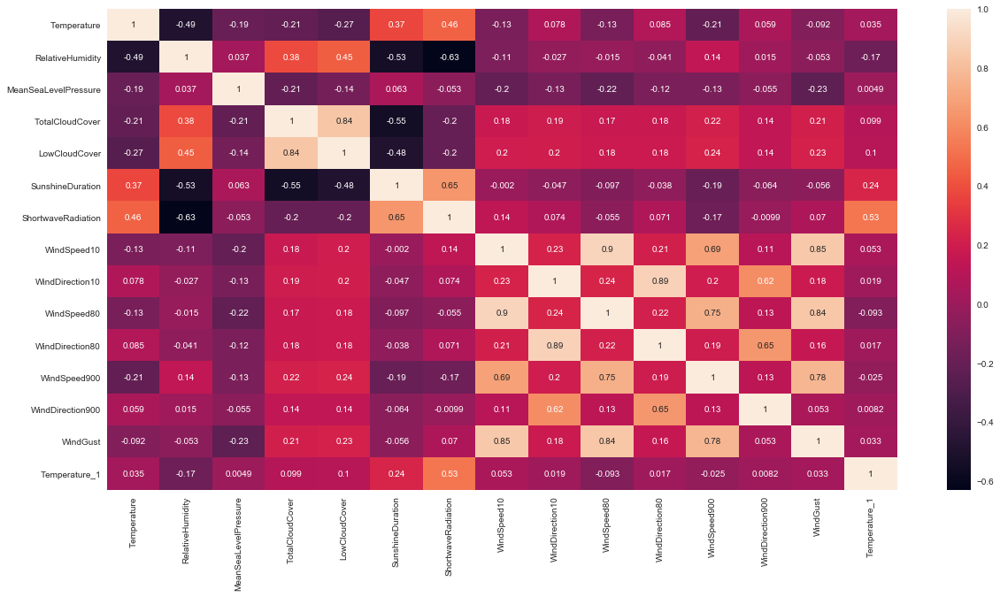

In [33]:
corrMatrix = df.corr(method='spearman')
plt.figure(figsize = (20,10))
sns.heatmap(corrMatrix, annot=True)

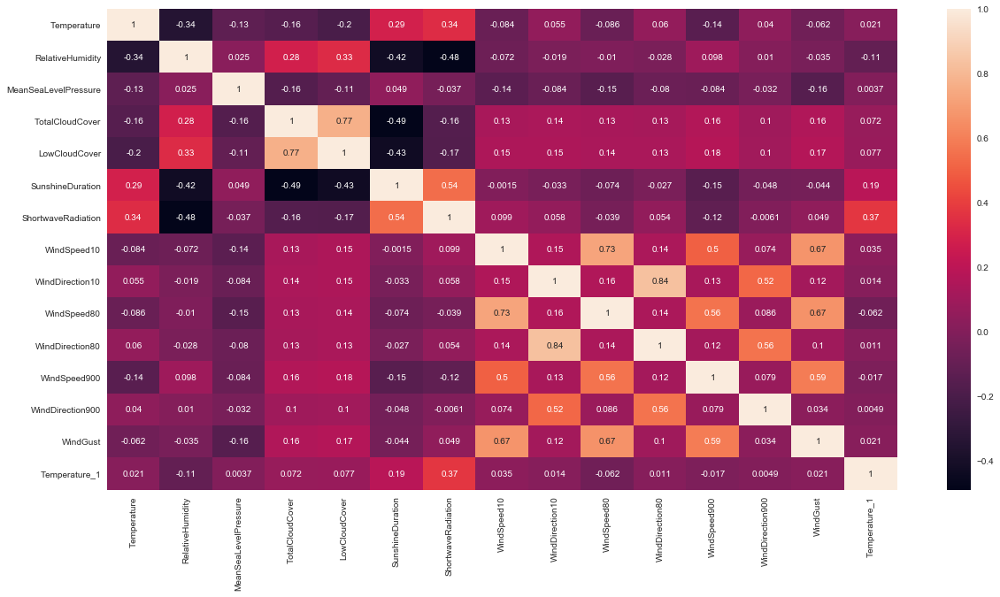

In [34]:
corrMatrix = df.corr(method='kendall')
plt.figure(figsize = (20,10))
sns.heatmap(corrMatrix, annot=True)

In [10]:
from scipy.stats import shapiro
stat, p = shapiro(df['detrend'][:])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.993, p=0.000
Sample does not look Gaussian (reject H0)


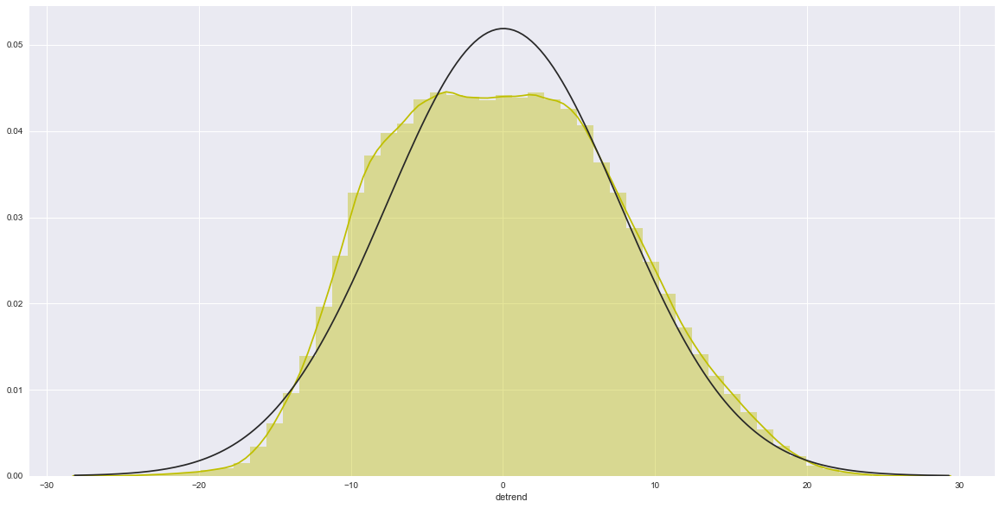

In [9]:
plt.figure(figsize = (20,10))
sns.distplot(df['detrend'], color="y",   fit=stats.norm)


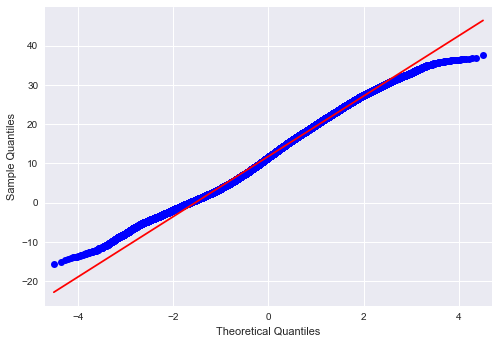

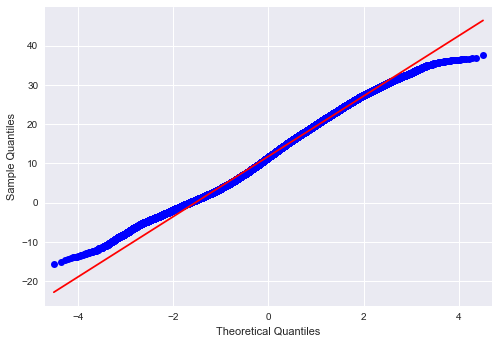

In [137]:
from statsmodels.graphics.gofplots import qqplot
qqplot(df['Temperature'][:], line='s')

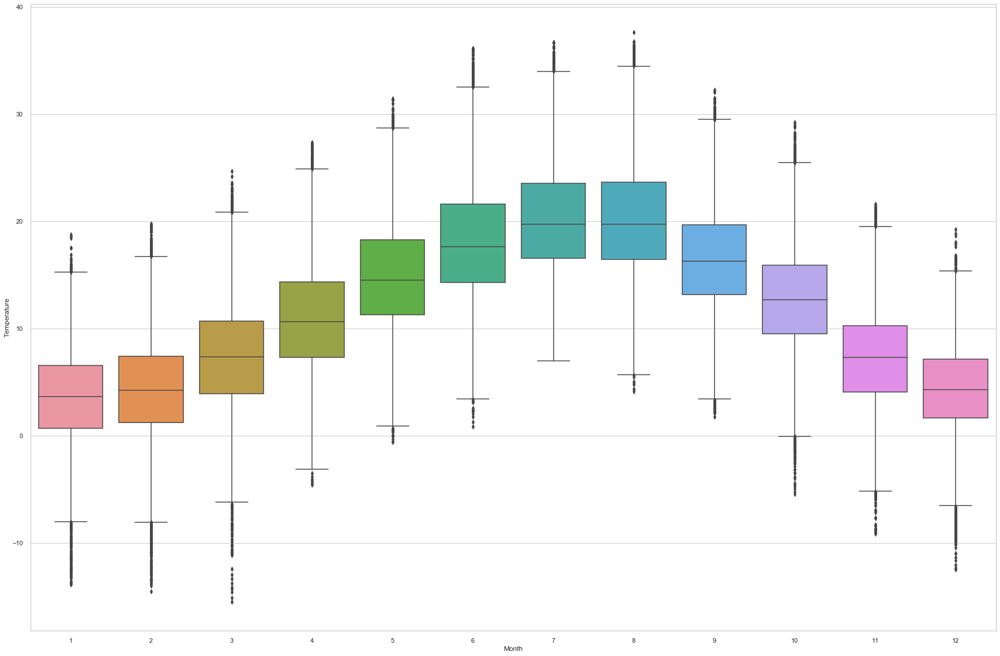

In [24]:
sns.set(style="whitegrid")
plt.figure(figsize=(30,20))
sns.boxplot(x=df['Month'], y=df['Temperature'])

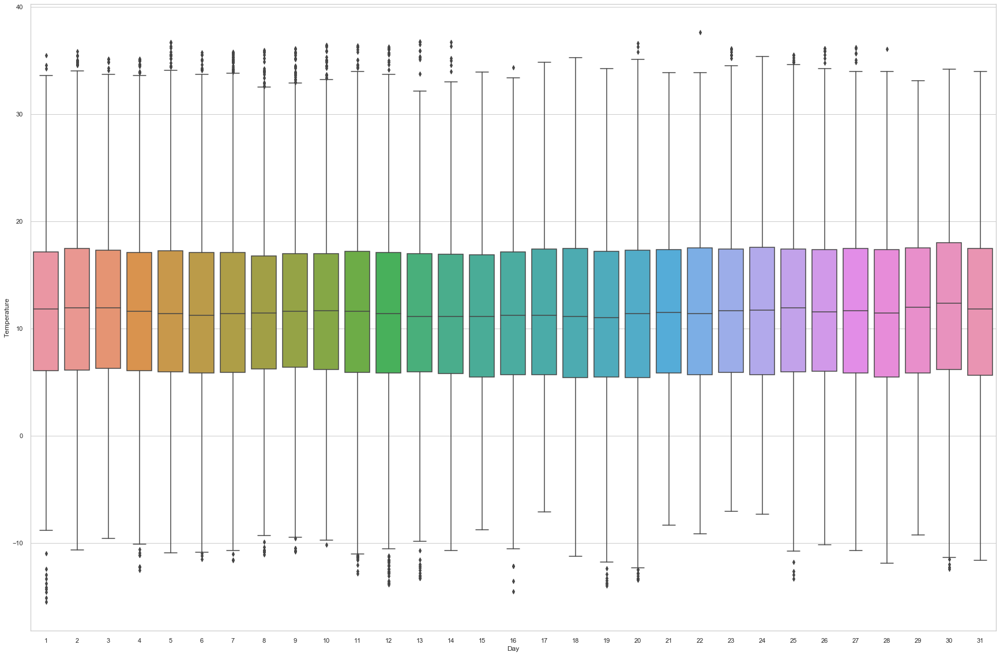

In [25]:
plt.figure(figsize=(30,20))
sns.boxplot(x=df['Day'], y=df['Temperature'])

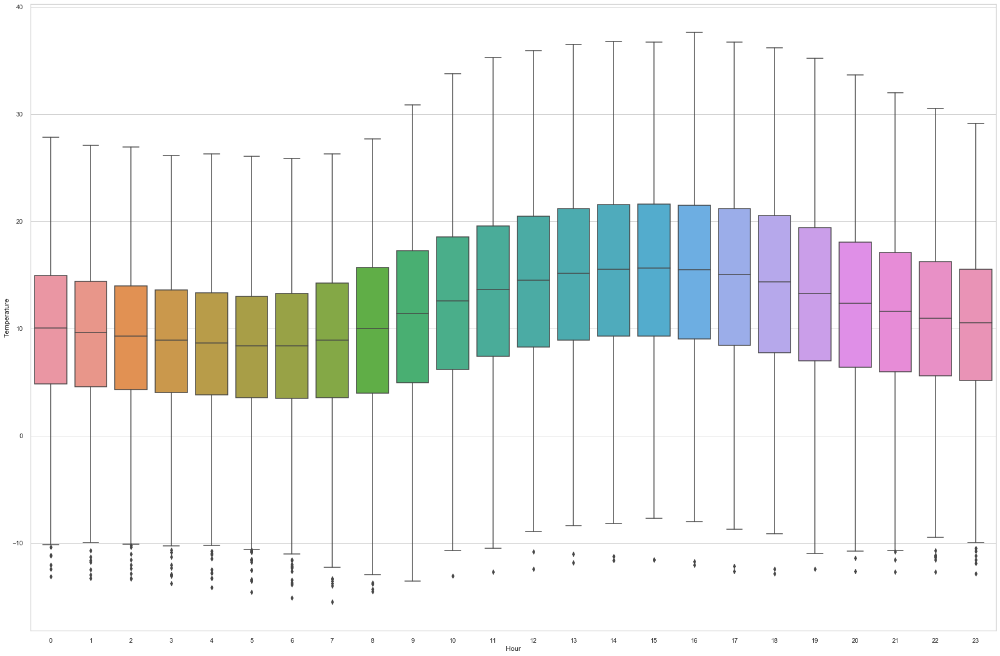

In [27]:
plt.figure(figsize=(30,20))
sns.boxplot(x=df['Hour'], y=df['Temperature'])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000019E352118C8>,
      dtype=object)

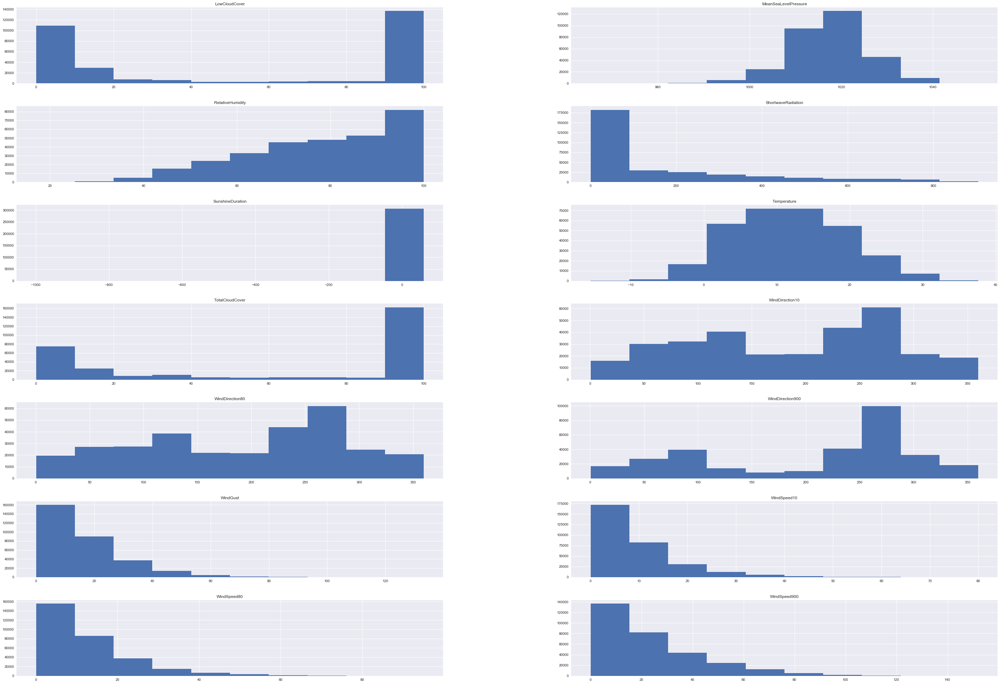

In [8]:
df.hist(grid=True,layout=(7,2),figsize=(50,35))

# SARIMAX


In [47]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import warnings
warnings.filterwarnings('ignore')


# Data Preprocessing

## 24 Hours

In [106]:
def hour_24(df_basel,df):   
    for x in range(0,24):
        if x==0:
             df_0=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4) | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==1:
             df_1=df_basel.drop(df[( df['Hour'] ==0) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==2:
             df_2=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==0)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==3:
             df_3=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==0) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==4:
             df_4=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==0)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==5:
             df_5=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==0) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)

        
        if x==6:
             df_6=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==0)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==7:
             df_7=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==0) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==8:
             df_8=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==0)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==9:
             df_9=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==0)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==10:
             df_10=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==0)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==11:
             df_11=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==0)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)

        
        if x==12:
             df_12=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==0)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==13:
             df_13=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==0)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==14:
             df_14=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==0)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==15:
             df_15=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==0)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==16:
             df_16=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==0)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==17:
             df_17=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==0)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==18:
             df_18=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==0)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==19:
             df_19=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==0)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==20:
             df_20=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==0)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==21:
             df_21=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==0)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4) |  (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==22:
             df_22=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==0)  |(df['Hour'] ==23)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)


        if x==23:
             df_23=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==0)| (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)

    hours=[df_0, df_1, df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9, df_10, df_11, df_12, df_13, df_14, df_15, df_16, df_17, df_18, df_19, df_20, df_21, df_22, df_23]
    return(hours)

In [108]:
data=hour_24(df_basel,df)

# 24 hours full

In [5]:
def hour_24_full(df_basel,df):   
    for x in range(0,24):
        if x==0:
             df_0=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)

        if x==1:
             df_1=df_basel.drop(df[( df['Hour'] ==0) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)

        if x==2:
             df_2=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==0)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)

        if x==3:
             df_3=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==0) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)

        if x==4:
             df_4=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==0)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)

        if x==5:
             df_5=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==0) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)

        
        if x==6:
             df_6=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==0)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==7:
             df_7=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==0) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==8:
             df_8=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==0)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==9:
             df_9=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==0)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==10:
             df_10=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==0)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==11:
             df_11=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==0)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)

        
        if x==12:
             df_12=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==0)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==13:
             df_13=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==0)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==14:
             df_14=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==0)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==15:
             df_15=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==0)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==16:
             df_16=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==0)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==17:
             df_17=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==0)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==18:
             df_18=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==0)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==19:
             df_19=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==0)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==20:
             df_20=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==0)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23)].index)


        if x==21:
             df_21=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==0)| (df['Hour'] ==22)  |(df['Hour'] ==23) ].index)


        if x==22:
             df_22=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==0)  |(df['Hour'] ==23)].index)


        if x==23:
             df_23=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==0)].index)

    #df_0['std'] = df_0['Temperature_1'].rolling(12).std()
    #df_1['std'] = df_1['Temperature_1'].rolling(12).std()
    #df_0['Temperature_1']=df['Temperature_1'].rolling(4).mean()
    #df_1['Temperature_1']=df['Temperature_1'].rolling(4).mean()
    #df_0=df_0[304:]
    #df_1=df_1[304:]           
                
    hours=[df_0, df_1, df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9, df_10, df_11, df_12, df_13, df_14, df_15, df_16, df_17, df_18, df_19, df_20, df_21, df_22, df_23]
    return(hours)

## 6 hours

In [62]:
def hours_6(df_basel,df):
    for x in range(0,24):
        if x==0:
             df_0=df_basel.drop(df[ (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==1:
             df_1=df_basel.drop(df[( df['Hour'] ==0) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==1) |(df['Hour'] ==5) | (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==2:
             df_2=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==0)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==2)  | (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==3:
             df_3=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==2)| (df['Hour'] ==0) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==3)   | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  | (df['Month'] ==11)| (df['Month'] ==12)].index)
   
    
    a=[df_0, df_1, df_2, df_3]
    return(a) 

## 8 hours

In [20]:
def hours_8(df_basel,df):
     for x in range(0,24):
        if x==0:
             df_0=df_basel.drop(df[  (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)| (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==1:
             df_1=df_basel.drop(df[( df['Hour'] ==0) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==1) |(df['Hour'] ==5) | (df['Hour'] ==6)  |(df['Hour'] ==7)  | (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4) | (df['Month'] ==11)| (df['Month'] ==12)].index)

        if x==2:
            df_2=df_basel.drop(df[( df['Hour'] ==1) | (df['Hour'] ==0)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==5) | (df['Hour'] ==6)| (df['Hour'] ==7) | (df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)| (df['Hour'] ==2)  | (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)
     v=[df_0, df_1, df_2]
     return(v)

## 12 hours

In [1]:
def hour_12(df_basel,df):
    for x in range(0,24):
        if x==0:
             df_0=df_basel.drop(df[   (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  |(df['Month'] ==8) | (df['Month'] ==9)| (df['Month'] ==10) | (df['Month'] ==11)| (df['Month'] ==12)].index)
        if x==1:
             df_1=df_basel.drop(df[( df['Hour'] ==0) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==1) |(df['Hour'] ==5) | (df['Hour'] ==6)  |(df['Hour'] ==7)  |(df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)  | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)  |(df['Month'] ==8) | (df['Month'] ==9)| (df['Month'] ==10) | (df['Month'] ==11)| (df['Month'] ==12)].index)
        
   # df_0['std'] = df_0['Temperature_1'].rolling(12).std()
    #df_1['std'] = df_1['Temperature_1'].rolling(12).std()
    #df_0['Temperature_1']=df['Temperature_1'].rolling(4).mean()
    #df_1['Temperature_1']=df['Temperature_1'].rolling(4).mean()
    #df_0=df_0[1104:]
    #df_1=df_1[1104:]
    h=[df_0, df_1]
    
    return(h)

# 6 months 12 hours

In [90]:
def hour_12_6(df_basel,df):
    for x in range(0,24):
        if x==0:
             df_0=df_basel.drop(df[   (df['Hour'] ==12)  |(df['Hour'] ==13)| (df['Hour'] ==14)  |(df['Hour'] ==15)| (df['Hour'] ==16)  |(df['Hour'] ==17)| (df['Hour'] ==18)  |(df['Hour'] ==19)| (df['Hour'] ==20)  |(df['Hour'] ==21)| (df['Hour'] ==22)  |(df['Hour'] ==23) | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)
        if x==1:
             df_1=df_basel.drop(df[( df['Hour'] ==0) | (df['Hour'] ==2)| (df['Hour'] ==3) | (df['Hour'] ==4)  |(df['Hour'] ==1) |(df['Hour'] ==5) | (df['Hour'] ==6)  |(df['Hour'] ==7)  |(df['Hour'] ==8)| (df['Hour'] ==9)| (df['Hour'] ==10)  | (df['Hour'] ==11)  | (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)
        
    #df_0['std'] = df_0['Temperature_1'].rolling(12).std()
    #df_1['std'] = df_1['Temperature_1'].rolling(12).std()
    #df_0['Temperature_1']=df['Temperature_1'].rolling(4).mean()
    #df_1['Temperature_1']=df['Temperature_1'].rolling(4).mean()
    #df_0=df_0[2208:]
    #df_1=df_1[2208:]
    h=[df_0, df_1]
    
    return(h)

# No lag

In [23]:
def no_lag(df_basel,df):
    df_0=df_basel.drop(df[  (df['Month'] ==1) | (df['Month'] ==2)| (df['Month'] ==3) | (df['Month'] ==4)   | (df['Month'] ==11)| (df['Month'] ==12)].index)    
    #df_0['std'] = df_0['Temperature_1'].rolling(24).std()
   # df_0['Temperature_1']=df['Temperature_1'].rolling(4).mean()
    #df_0=df_0[2208:]
    h=df_0    
    return(h)

# No lag 6 months

In [31]:
def no_lag_6(df_basel,df):
    df_0=df_basel.drop(df[(df['Month'] ==1)   | (df['Month'] ==2)   |(df['Month'] ==3) |(df['Month'] ==4)  |  (df['Month'] ==11)| (df['Month'] ==12)].index)    
    h=[df_0]
    
    return(h)

# Resampling

In [72]:
hours=hour_24(df_basel,df)

In [75]:
hours[0]

,Year,Month,Day,Hour,Minute,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalPrecipationhigh,TotalPrecipationlow,...,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust,Temperature_shift,mean_temp,std,mean_4
10536,1986,5,1,0,0,8.05,100.0,1023.9,NaN,0.0,...,34.94,14.57,41.53,43.23,73.71,15.84,-0.04,11.529042,4.172098,11.529042
10560,1986,5,2,0,0,11.92,100.0,1016.9,NaN,0.0,...,108.12,5.98,111.61,7.87,152.13,6.48,-0.76,11.727250,3.045518,11.727250
10584,1986,5,3,0,0,9.19,100.0,1013.0,NaN,0.0,...,113.85,7.85,134.92,4.00,228.42,9.00,-0.84,12.436958,5.809233,12.436958
10608,1986,5,4,0,0,11.60,99.0,1013.1,NaN,0.1,...,241.97,11.33,247.93,35.02,282.91,15.84,0.05,12.883083,4.242348,12.883083
10632,1986,5,5,0,0,7.21,98.0,1013.0,NaN,0.0,...,126.59,8.35,131.61,3.35,98.70,7.56,-0.70,13.055750,4.020165,13.055750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304104,2019,10,27,0,0,15.89,59.0,1019.7,0.0,0.0,...,121.33,9.29,144.46,46.48,262.43,17.64,-0.67,15.566750,1.847103,15.566750
304128,2019,10,28,0,0,12.67,93.0,1020.6,0.2,0.6,...,337.83,14.00,342.03,13.68,270.00,7.20,-0.68,15.506083,2.950809,15.506083
304152,2019,10,29,0,0,9.79,86.0,1017.0,0.1,0.5,...,104.04,0.36,90.00,13.32,71.08,9.00,-0.12,14.798333,0.653547,14.798333
304176,2019,10,30,0,0,10.01,85.0,1021.1,0.0,0.3,...,96.91,18.94,98.75,27.21,117.58,12.60,-0.26,14.278917,0.318875,14.278917


In [87]:
hours[0].columns

Index(['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature',
       'RelativeHumidity', 'MeanSeaLevelPressure', 'TotalPrecipationhigh',
       'TotalPrecipationlow', 'SnowfallAmounthigh', 'SnowfallAmountlow',
       'TotalCloudCover', 'HighCloudCover', 'MediumCloudCover',
       'LowCloudCover', 'SunshineDuration', 'ShortwaveRadiation',
       'WindSpeed10', 'WindDirection10', 'WindSpeed80', 'WindDirection80',
       'WindSpeed900', 'WindDirection900', 'WindGust', 'Temperature_shift',
       'mean_temp', 'std', 'mean_4'],
      dtype='object')

In [11]:
def resampling_A(day,data):
    X=np.array([])
    train=np.array([])
    X=data.iloc[:,[0,1,2,3,26,6,28,27,5]].values
    train=X[:4416,:]
    for i in range(4416,len(data) ,4416):
        result=X[i:4416+i,:]
        train = np.concatenate((train, result), axis=1)
    #train=np.delete(train,[259],1)
    train_2=deepcopy(train)
    train_3=deepcopy(train)
    train_4=deepcopy(train)
    train_5=deepcopy(train)
    train_6=deepcopy(train)
    train_7=deepcopy(train)
    train_8=deepcopy(train)
    train_9=deepcopy(train)
    train=np.delete(train,list(range(train.shape[1]-72,train.shape[1])),1)
    list_one=list(range(9))
    list_two=list(range(train_2.shape[1]-63,train_2.shape[1]))
    all_list=list_one+list_two
    train_2=np.delete(train_2,list(all_list),1)
    #print(train_2.shape)
    result=np.concatenate(( train ,train_2), axis=0)
    for i,j in zip(range(1,8),range(18,81,9)):
        if i==1:
            list_one=list(range(j))
            list_two=list(range(train_3.shape[1]-54,train_3.shape[1]))
            all_list=list_one+list_two
            train_3=np.delete(train_3,all_list,1)
            result=np.concatenate((result,train_3),axis=0)
        if i==2:
            list_one=list(range(j))
            list_two=list(range(train_4.shape[1]-45,train_4.shape[1]))
            all_list=list_one+list_two
            train_4=np.delete(train_4,all_list,1)
            result=np.concatenate((result,train_4),axis=0)
        if i==3:
            list_one=list(range(j))
            list_two=list(range(train_5.shape[1]-36,train_5.shape[1]))
            all_list=list_one+list_two
            train_5=np.delete(train_5,all_list,1)
            result=np.concatenate((result,train_5),axis=0)
        if i==4:
            list_one=list(range(j))
            list_two=list(range(train_6.shape[1]-27,train_6.shape[1]))
            all_list=list_one+list_two
            train_6=np.delete(train_6,all_list,1)
            result=np.concatenate((result,train_6),axis=0)
        if i==5:
            list_one=list(range(j))
            list_two=list(range(train_7.shape[1]-18,train_7.shape[1]))
            all_list=list_one+list_two
            train_7=np.delete(train_7,all_list,1)
            result=np.concatenate((result,train_7),axis=0)
        if i==6:
            list_one=list(range(j))
            list_two=list(range(train_8.shape[1]-9,train_8.shape[1]))
            all_list=list_one+list_two
            train_8=np.delete(train_8,all_list,1)
            result=np.concatenate((result,train_8),axis=0)
        if i==7:
            list_one=list(range(j))
            list_two=list(range(train_9.shape[1]-0,train_9.shape[1]))
            all_list=list_one+list_two
            train_9=np.delete(train_9,all_list,1)
            result=np.concatenate((result,train_9),axis=0)
            
    result=np.delete(result,[232,231,230,229],1)
    return(result)

In [110]:
def resampling_A_B(day,data):
    X=np.array([])
    train=np.array([])
    X=data.iloc[:,[0,1,2,3,26,6,16,17,28,27,5]].values
    train=X[:184,:]
    for i in range(184,len(data) ,184):
        result=X[i:184+i,:]
        train = np.concatenate((train, result), axis=1)
    #train=np.delete(train,[259],1)
    train_2=deepcopy(train)
    train_3=deepcopy(train)
    train_4=deepcopy(train)
    train_5=deepcopy(train)
    train_6=deepcopy(train)
    train_7=deepcopy(train)
    train_8=deepcopy(train)
    train_9=deepcopy(train)
    train=np.delete(train,list(range(train.shape[1]-88,train.shape[1])),1)
    list_one=list(range(11))
    list_two=list(range(train_2.shape[1]-77,train_2.shape[1]))
    all_list=list_one+list_two
    train_2=np.delete(train_2,list(all_list),1)
    #print(train_2.shape)
    result=np.concatenate(( train ,train_2), axis=0)
    for i,j in zip(range(1,8),range(22,99,11)):
        if i==1:
            list_one=list(range(j))
            list_two=list(range(train_3.shape[1]-66,train_3.shape[1]))
            all_list=list_one+list_two
            train_3=np.delete(train_3,all_list,1)
            result=np.concatenate((result,train_3),axis=0)
        if i==2:
            list_one=list(range(j))
            list_two=list(range(train_4.shape[1]-55,train_4.shape[1]))
            all_list=list_one+list_two
            train_4=np.delete(train_4,all_list,1)
            result=np.concatenate((result,train_4),axis=0)
        if i==3:
            list_one=list(range(j))
            list_two=list(range(train_5.shape[1]-44,train_5.shape[1]))
            all_list=list_one+list_two
            train_5=np.delete(train_5,all_list,1)
            result=np.concatenate((result,train_5),axis=0)
        if i==4:
            list_one=list(range(j))
            list_two=list(range(train_6.shape[1]-33,train_6.shape[1]))
            all_list=list_one+list_two
            train_6=np.delete(train_6,all_list,1)
            result=np.concatenate((result,train_6),axis=0)
        if i==5:
            list_one=list(range(j))
            list_two=list(range(train_7.shape[1]-22,train_7.shape[1]))
            all_list=list_one+list_two
            train_7=np.delete(train_7,all_list,1)
            result=np.concatenate((result,train_7),axis=0)
        if i==6:
            list_one=list(range(j))
            list_two=list(range(train_8.shape[1]-11,train_8.shape[1]))
            all_list=list_one+list_two
            train_8=np.delete(train_8,all_list,1)
            result=np.concatenate((result,train_8),axis=0)
        if i==7:
            list_one=list(range(j))
            list_two=list(range(train_9.shape[1]-0,train_9.shape[1]))
            all_list=list_one+list_two
            train_9=np.delete(train_9,all_list,1)
            result=np.concatenate((result,train_9),axis=0)
            
    result=np.delete(result,[284,283,282,281,280,279],1)
    return(result)

In [104]:
data=hour_12_6(df_basel=df_basel,df=df)

In [67]:
len(data)

24

In [76]:
data[0].iloc[0:6246,:4].values

array([[1986,    5,    1,    0],
       [1986,    5,    2,    0],
       [1986,    5,    3,    0],
       ...,
       [2019,   10,   19,    0],
       [2019,   10,   20,    0],
       [2019,   10,   21,    0]], dtype=int64)

In [85]:
75072-120

74952

In [15]:
train.shape

(1104, 305)

In [61]:
data= no_lag_6(df_basel=df_basel,df=df)

In [9]:
len(data[0])

150144

In [111]:
train=resampling_A_B(day=92,data=data[0])

In [112]:
train.shape

(1656, 280)

In [47]:
19872-120

19752

In [48]:

print(train)

[[1986.      5.      1.   ...    1.      0.     -0.87]
 [1986.      5.      2.   ...    2.      0.     -0.93]
 [1986.      5.      3.   ...    3.      0.      0.55]
 ...
 [1994.     10.     29.   ...   29.      0.     -0.12]
 [1994.     10.     30.   ...   30.      0.     -0.26]
 [1994.     10.     31.   ...   31.      0.     -0.34]]


# Voting regressor




.Mean Absolute Error: 1.998490767593512
.Mean Squared Error 5.583150272738965
.Root Mean Squared Error: 2.362869076512485
.R2 0.20894510666659316
11.576500000000003 11.218975615785572


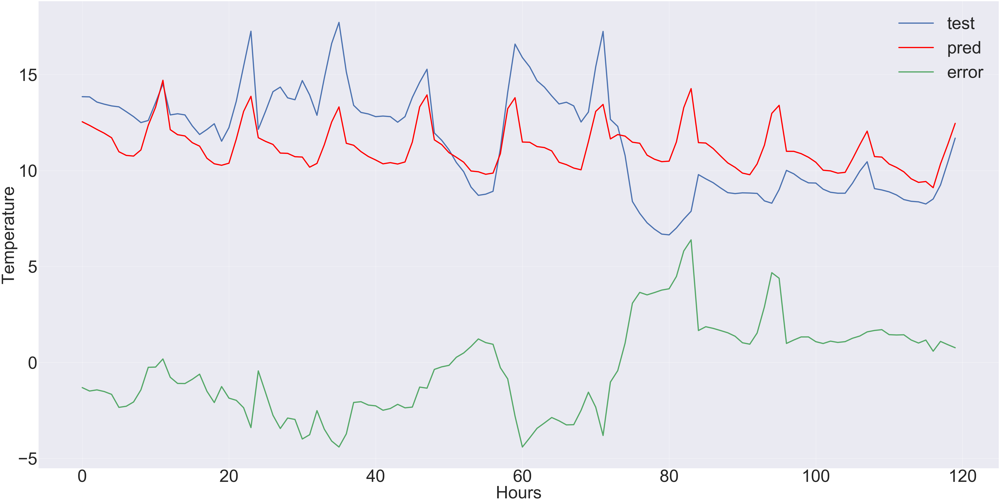

.Mean Absolute Error: 2.6079907549956816
.Mean Squared Error 9.492883361244518
.Root Mean Squared Error: 3.08105231394154
.R2 0.3943900573113125
14.694916666666666 14.807206184092385


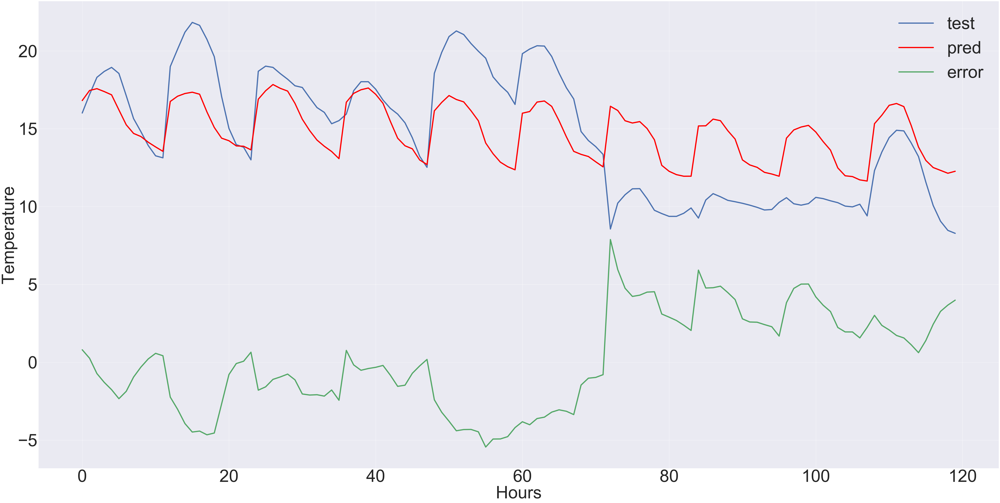

In [94]:
mean=[]
game=[]

for i in range(2):
    train=resampling_A_B(day=92,data=data[i])  
    #X_train,y_train=data[i].iloc[0:6246,:4].values, data[i].iloc[:6246,5].values
    #X_test, y_test=data[i].iloc[6246:,:4].values, data[i].iloc[6246:,5].values
    
    X_train,y_train=train[0:19752,:279], train[:19752,279]
    X_test, y_test=train[19752:,:279], train[19752:,279]
    regressor=RandomForestRegressor(n_estimators=300)
    reg=xgb.XGBRegressor(n_estimators=1000)
    tree_reg =DecisionTreeRegressor()
    reg_a = linear_model.BayesianRidge()
    Svr=sklearn.svm.SVR(kernel='rbf')
    regressor_n = DecisionTreeRegressor(random_state=0)
    ada = AdaBoostRegressor(random_state=0, n_estimators=100)
    regr = linear_model.LinearRegression()
    ereg = VotingRegressor(estimators=[('RD',regressor),('XGB',reg),('SVR',Svr),('Lin',regr),('ada',ada)])
    ereg.fit(X_train, y_train)
    y_pred=ereg.predict(X_test)
    plt.figure(figsize = (100,50))
    plt.xlabel('Date', fontsize=40)
    plt.ylabel('Temperature',fontsize=40)
    plt.plot(y_test,label='test',linewidth=7.0)
    plt.plot(y_pred, label='pred',linewidth=7.0, color='r')
    error=y_pred-y_test
    plt.plot(y_pred-y_test,label="error",linewidth=7.0)
    print('.Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
    print('.Mean Squared Error', metrics.mean_squared_error(y_test, y_pred))
    print('.Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('.R2', metrics.r2_score(y_test,y_pred))
    print(np.mean(y_test),np.mean(y_pred))
    st_interval = st.t.interval(0.95, len(y_test) -1, loc=np.mean(y_test), scale=st.sem(y_test))
    plt.legend(loc="upper left")
    plt.legend(fontsize=30)
    plt.xticks(size = 50)
    plt.yticks(size = 50)
    plt.xlabel('Date', fontsize=40)
    plt.ylabel('Temperature',fontsize=40)
    mean.append(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    game.append(metrics.mean_absolute_error(y_test,y_pred))  
    plt.show()

In [78]:
mean

[1.4779233403488101,
 1.331426360179413,
 1.1677796859553091,
 1.521277152608459,
 1.7034060467764602,
 1.761293099451234,
 2.1683145374655104,
 2.0192476782314532,
 2.0798462837022,
 2.156416726490096,
 2.54566886376222,
 2.8515530092489993,
 3.5305802640294943,
 3.3961040359258545,
 3.5333041504770484,
 3.689210757607873,
 3.4519556867683083,
 3.2550233810672236,
 3.0205803506406634,
 2.658669564796898,
 2.6036989632962793,
 2.7511865362261454,
 2.465608626404447,
 2.163595337523677]

In [79]:
mean=np.array(mean)
np.sqrt(sum((mean**2)/len(mean)))

2.581267493469502

In [80]:
np.sqrt(sum((mean**2)/len(mean)))

2.581267493469502

In [81]:
game=np.array(game)

In [82]:
game=np.array(game)
np.sqrt(sum((game**2)/len(game)))

2.219644519335393

In [131]:
X=np.array([])
train=np.array([])
X=data[0].iloc[:,[0,1,2,3,25,6,27,26,5]].values
train=X[:2208,:]
for i in range(2208,len(data[0]) ,2208):
    result=X[i:2208+i,:]
    train = np.concatenate((train, result), axis=1)


In [132]:
train=np.delete(train,[304,303,302,301],1)

In [133]:
train.shape

(2208, 302)

0
(2208, 302)
.Mean Absolute Error: 2.9346926937691062
.Mean Squared Error 14.105875449173128
.Root Mean Squared Error: 3.7557789404027933
.R2 -0.9033822938433975
11.37703703703704 13.730448790208849
9
(2208, 293)
.Mean Absolute Error: 2.572065900380665
.Mean Squared Error 10.91537069289838
.Root Mean Squared Error: 3.303841808092267
.R2 -0.4728701796964887
11.37703703703704 12.894103906907741
18
(2208, 275)
.Mean Absolute Error: 3.0189409117959265
.Mean Squared Error 15.556106861316184
.Root Mean Squared Error: 3.944123078875225
.R2 -1.0990698852867493
11.37703703703704 13.535918424912806
27
(2208, 248)
.Mean Absolute Error: 3.185634314697773
.Mean Squared Error 16.119359269669047
.Root Mean Squared Error: 4.014892186556079
.R2 -1.175072588194943
11.37703703703704 13.30779049448322
36
(2208, 212)
.Mean Absolute Error: 3.6912231870913645
.Mean Squared Error 24.51147014016286
.Root Mean Squared Error: 4.950905991852689
.R2 -2.307465632244185
11.37703703703704 14.469253459157764


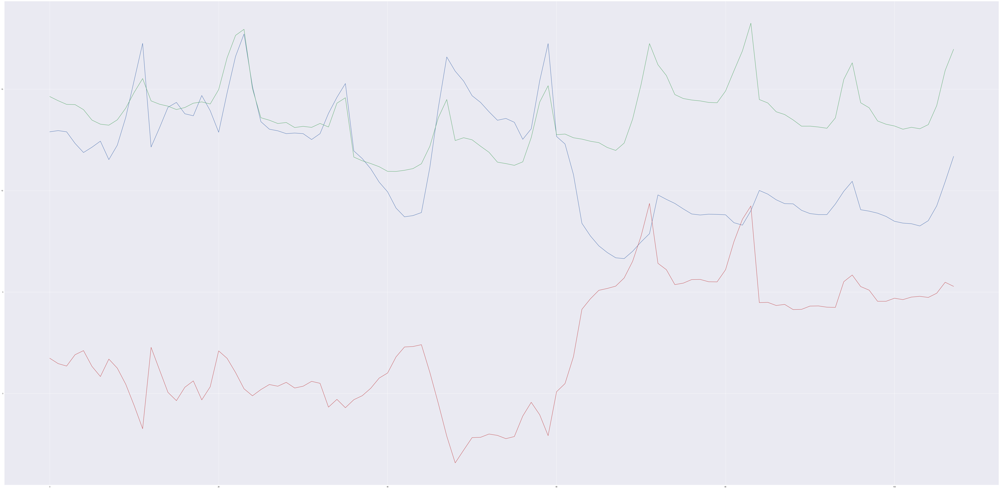

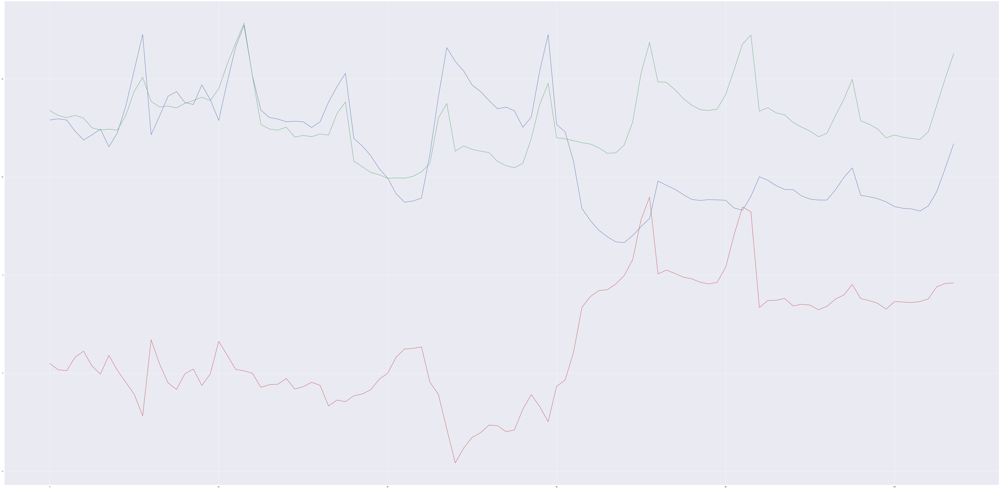

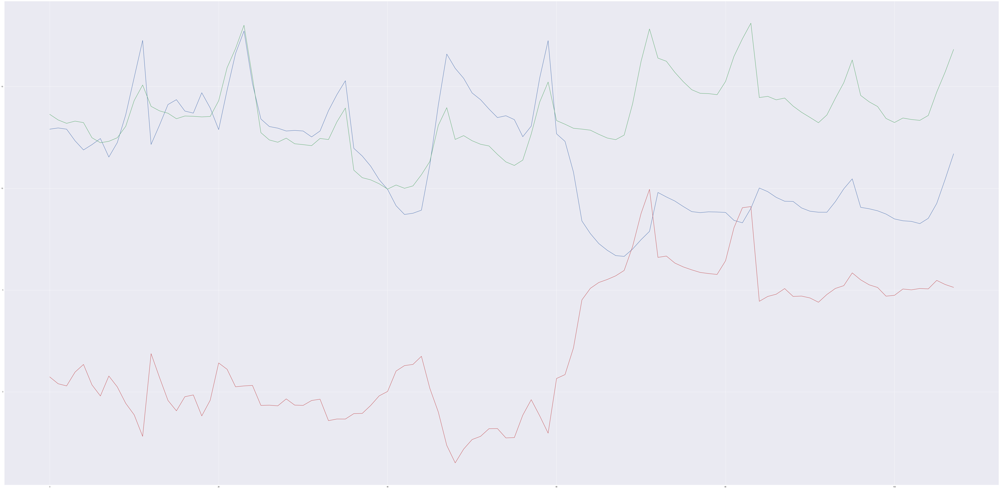

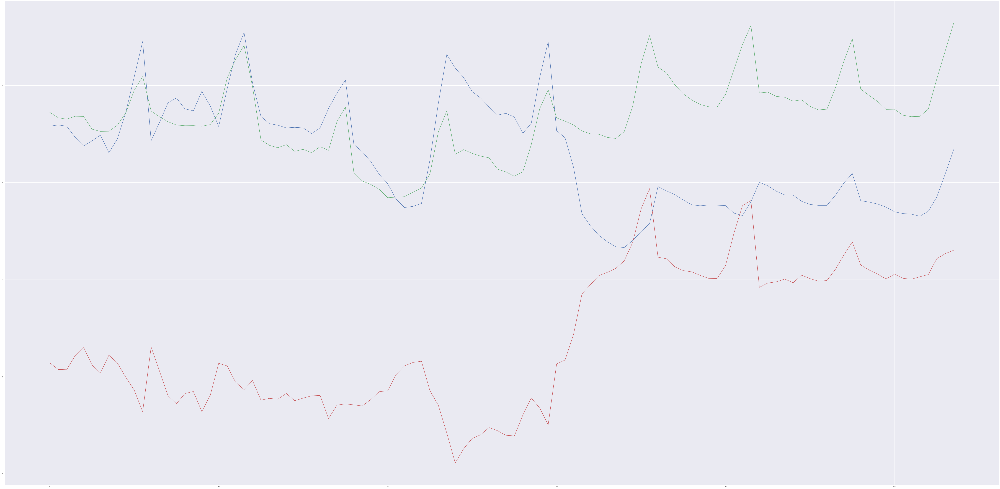

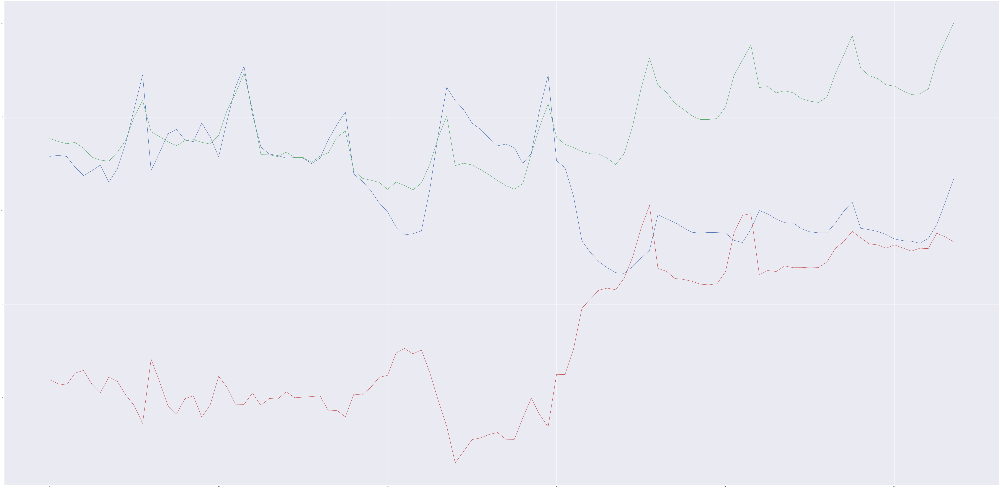

In [134]:
mean=[]
game=[]

for j in range(0,45,9):
    print(j)
    train=np.delete(train,list(range(j)),1)
    print(train.shape)
    #print(train.shape)
    #df=pd.DataFrame(train)
    #df=df[np.abs(df.iloc[:,train.shape[1]]-df.iloc[:,train.shape[1]].mean()) <= (3*df.iloc[:,train.shape[1]].std())]
    #df.dropna(inplace=True)
    #train=df.values
   # print(train.shape)
    X_train,y_train=train[0:2100,:train.shape[1]-1], train[:2100,train.shape[1]-1]
    X_test, y_test=train[2100:,:train.shape[1]-1], train[2100:,train.shape[1]-1]
    regressor=RandomForestRegressor(n_estimators=300)
    reg=xgb.XGBRegressor(n_estimators=1000)
    tree_reg =DecisionTreeRegressor()
    reg_a = linear_model.BayesianRidge()
    Svr=sklearn.svm.SVR(kernel='rbf')
    regressor_n = DecisionTreeRegressor(random_state=0)
    ada = AdaBoostRegressor(random_state=0, n_estimators=100)
    regr = linear_model.LinearRegression()
    ereg = VotingRegressor(estimators=[('RD',regressor),('XGB',reg),('B', reg_a),('SVR',Svr),('Lin',regr),('ada',ada)])
    ereg.fit(X_train, y_train)
    y_pred=ereg.predict(X_test)
    plt.figure(figsize = (100,50))
    plt.plot(y_test)
    plt.plot(y_pred)
    error=y_pred-y_test
    plt.plot(y_pred-y_test)
    print('.Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
    print('.Mean Squared Error', metrics.mean_squared_error(y_test, y_pred))
    print('.Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('.R2', metrics.r2_score(y_test,y_pred))
    print(np.mean(y_test),np.mean(y_pred))
    st_interval = st.t.interval(0.95, len(y_test) -1, loc=np.mean(y_test), scale=st.sem(y_test))
    mean.append(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    game.append(error)  

SyntaxError: unexpected EOF while parsing (<ipython-input-119-78f350941069>, line 3)

.Mean Absolute Error: 4.28150770004788
.Mean Squared Error 25.971339306373395
.Root Mean Squared Error: 5.096208326429895
.R2 0.016055962235517862
26.6486507936508 24.816962285551153


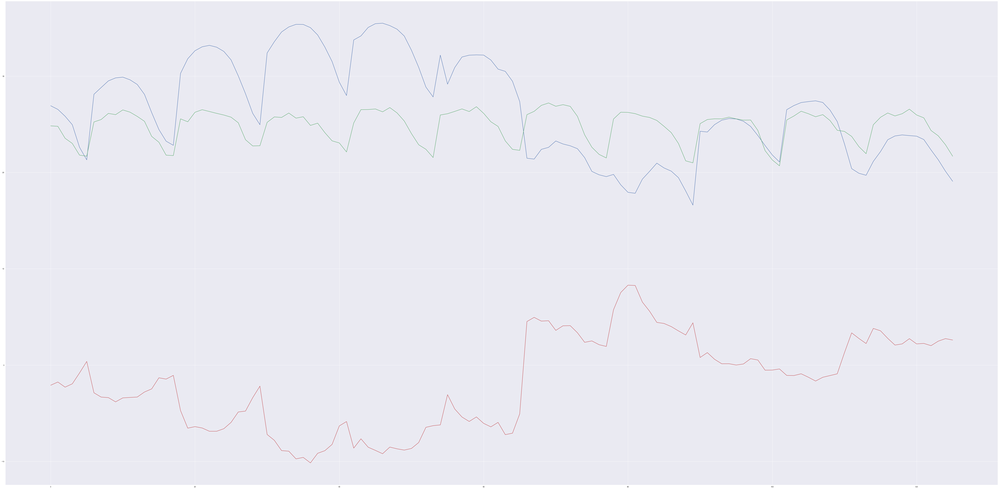

In [90]:
mean=[]
game=[]

  
train=resampling_A(day=92,data=data[1])
    #print(train.shape)
df = pd.DataFrame(train)
df=df[np.abs(df.iloc[:,229]-df.iloc[:,229].mean()) <= (3*df.iloc[:,229].std())]
df.dropna(inplace=True)
train=df.values
   # print(train.shape)
X_train,y_train=train[0:9800,:229], train[0:9800,229]
X_test, y_test=train[9800:,:229], train[9800:,229]
regressor=RandomForestRegressor(n_estimators=300)
reg=xgb.XGBRegressor(n_estimators=1000)
tree_reg =DecisionTreeRegressor()
reg_a = linear_model.BayesianRidge()
Svr=sklearn.svm.SVR(kernel='rbf')
regressor_n = DecisionTreeRegressor(random_state=0)
regr = linear_model.LinearRegression()
ada = AdaBoostRegressor(random_state=0, n_estimators=100)
ereg = VotingRegressor(estimators=[('RD',regressor),('XGB',reg),('B', reg_a),('SVR',Svr),('Lin',regr),('ada',ada)])
ereg.fit(X_train, y_train)
y_pred=ereg.predict(X_test)
plt.figure(figsize = (100,50))
plt.plot(y_test)
plt.plot(y_pred)
error=y_pred-y_test
plt.plot(y_pred-y_test)
print('.Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
print('.Mean Squared Error', metrics.mean_squared_error(y_test, y_pred))
print('.Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('.R2', metrics.r2_score(y_test,y_pred))
print(np.mean(y_test),np.mean(y_pred))
st_interval = st.t.interval(0.95, len(y_test) -1, loc=np.mean(y_test), scale=st.sem(y_test))
mean.append(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
game.append(error)  

# ARMA model to foreacast error

In [150]:
df=pd.DataFrame(error)

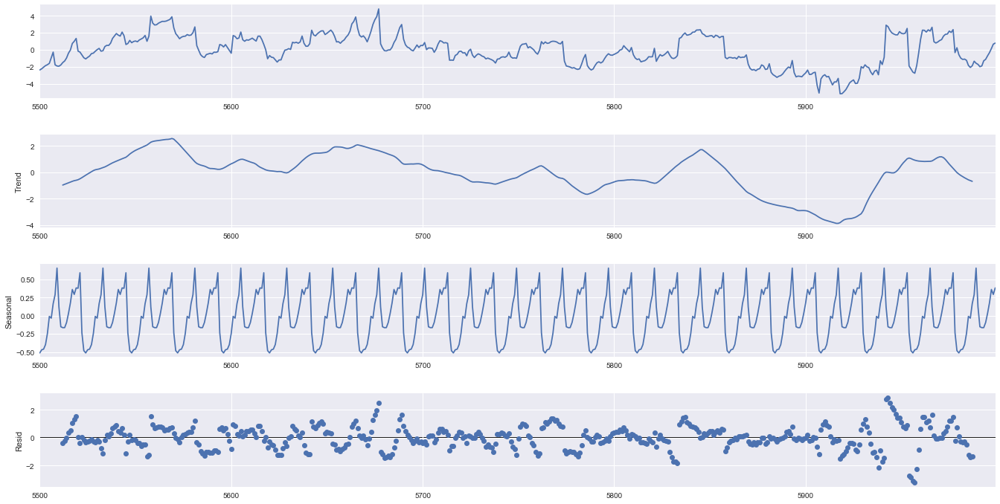

In [151]:
result = seasonal_decompose(df[5500:], model='additive',period=24)
fig=result.plot()

fig.set_figheight(10)
fig.set_figwidth(20)
plt.show()

In [152]:
result.seasonal

5500   -0.512652
5501   -0.469548
5502   -0.460479
5503   -0.398308
5504   -0.244462
          ...   
5995    0.030906
5996    0.175330
5997    0.358884
5998    0.290748
5999    0.380256
Name: seasonal, Length: 500, dtype: float64

In [153]:
a=result.trend.dropna()

In [154]:
a

5512   -0.957427
5513   -0.902494
5514   -0.847449
5515   -0.790873
5516   -0.733112
          ...   
5983   -0.406486
5984   -0.486814
5985   -0.562190
5986   -0.621886
5987   -0.676171
Name: trend, Length: 476, dtype: float64

In [155]:
df=pd.DataFrame(a)

In [156]:
df.reset_index(inplace=True)

In [158]:
df=df.drop(['index'], axis=1)

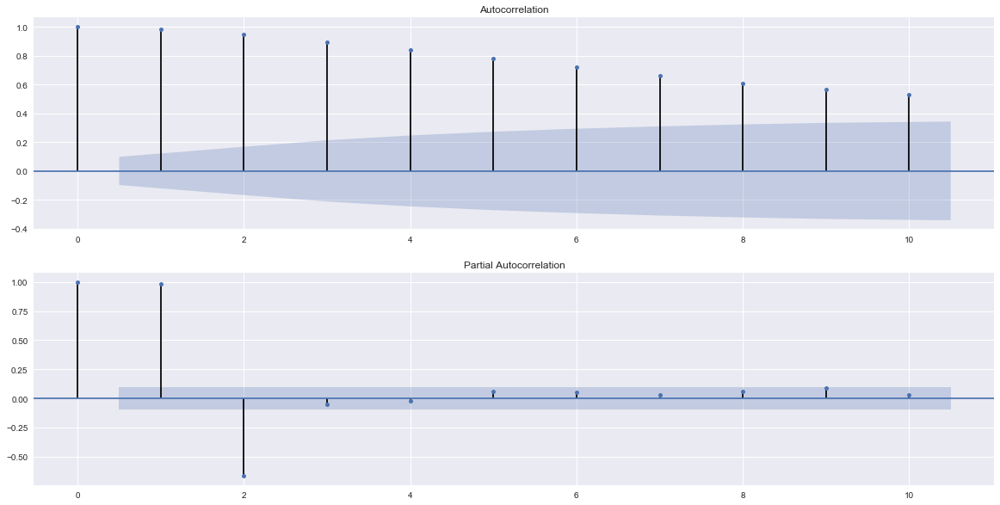

In [22]:
fig,ax = plt.subplots(2,1,figsize=(20,10))
fig = sm.graphics.tsa.plot_acf(df['Temperature'][:400], lags=10, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(df['Temperature'][:400], lags=10, ax=ax[1])
plt.show()

In [23]:
model = sm.tsa.statespace.SARIMAX(df['Temperature'][:400], order=(3,1,2), seasonal_order=(3,1,2,24)).fit(max_iter=30, method='powell',freq="D")

Optimization terminated successfully.
         Current function value: 0.617703
         Iterations: 6
         Function evaluations: 840


In [24]:
res = model.resid


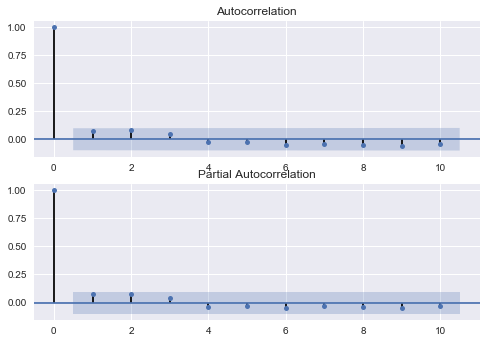

In [25]:
fig, ax = plt.subplots(2,1)
fig = sm.graphics.tsa.plot_acf(res, lags=10, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(res, lags=10, ax=ax[1])
plt.show()

In [26]:
SARIMAX_predictions = round(model.predict(), 2)

<Figure size 2880x720 with 0 Axes>

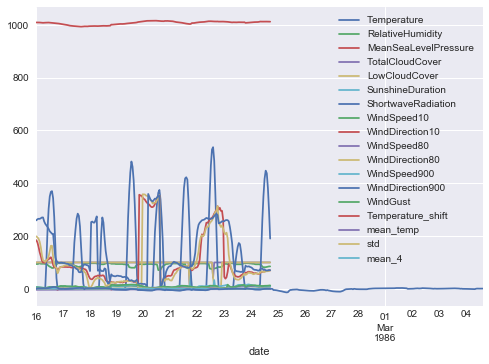

In [27]:
plt.figure(figsize = (40,10))
df[:210].plot()
SARIMAX_predictions.plot()

In [28]:
len(df)

298224

In [42]:
SARIMAX_forecast = round(model.forecast(steps = 72), 2)

(array([-4., -3., -2., -1.,  0.,  1.,  2.,  3.,  4.,  5.]),
 <a list of 10 Text yticklabel objects>)

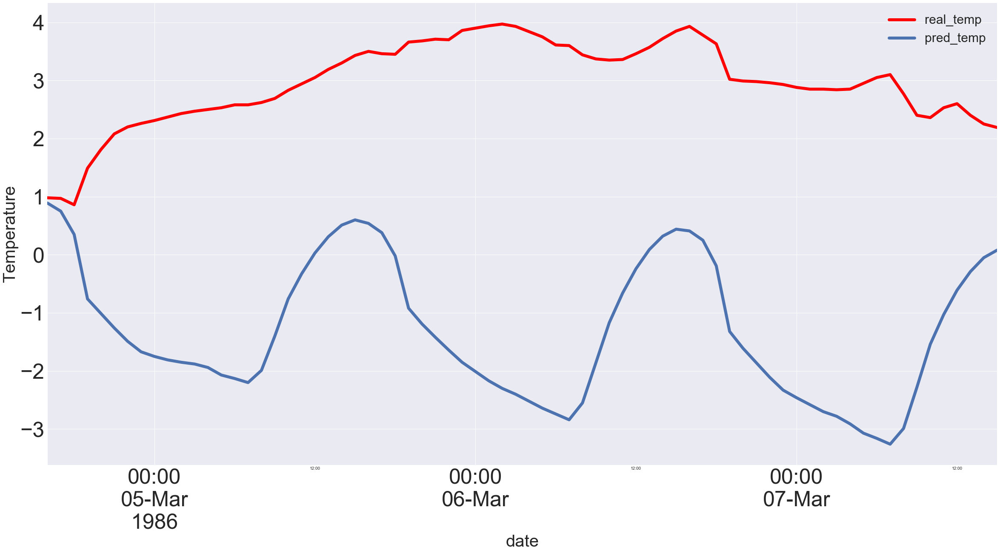

In [43]:
plt.figure(figsize = (40,20))
plt.xlabel('Date', fontsize=40)
plt.ylabel('Temperature',fontsize=40)
df['Temperature'][400:472].plot(label='real_temp', color='r', linewidth=7.0)
SARIMAX_forecast.plot(label='pred_temp',linewidth=7.0)
plt.legend(loc="upper left")
plt.legend(fontsize=30)
plt.xticks(size = 50)
plt.yticks(size = 50)



# Final forecast

(8832, 260)
.Mean Absolute Error: 0.31726133053686245
.Mean Squared Error 0.17025156802684333
.Root Mean Squared Error: 0.4126155208264024
.R2 0.7947773818067817
0.04377499999998667 -0.04197654505509698


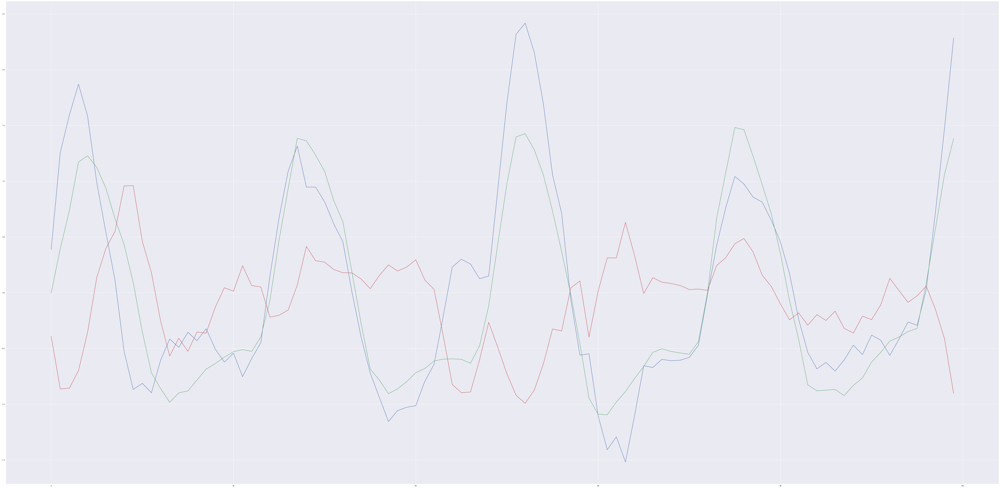

In [291]:
mean=[]
data=no_lag_6(df_basel=df_basel,df=df)
for i in range(len(data)):
    X=np.array([])
    train=np.array([])
    X=data[i].iloc[:,[0,1,2,25,6,17,16,26]].values
    train=X[:4416,:]
    for i in range(4416,148008 ,4416):
        result=X[i:4416+i,:]
        train = np.concatenate((train, result), axis=1)
    train_second=train
    train=np.delete(train,[260,261,262,263,264,265,266,267,268,269,270,271],1)
    train_second=np.delete(train_second,[0,1,2,3,4,5,6,7,268,269,270,271],1)
    train=np.concatenate(( train ,train_second), axis=0)
    print(train.shape)
    df = pd.DataFrame(train)
    df=df[np.abs(df-df.mean()) <= (5*df.std())]
    df.dropna(inplace=True)
    train=df.values
    X_train,y_train=train[0:7900,:259], train[:7900,259]
    X_test, y_test=train[7900:8000,:259], train[7900:8000,259]
    regressor=RandomForestRegressor(n_estimators=300)
    reg=xgb.XGBRegressor(n_estimators=1000)
    tree_reg =DecisionTreeRegressor()
    reg_a = linear_model.BayesianRidge()
    Svr=sklearn.svm.SVR(kernel='rbf')
    regressor_n = DecisionTreeRegressor(random_state=0)
    ereg = VotingRegressor(estimators=[('regr',regr),('RD',regressor),('XGB',reg),('B', reg_a),('SVR',Svr)])
    ereg.fit(X_train, y_train)
    y_pred=ereg.predict(X_test) #+SARIMAX_forecast.values
    plt.figure(figsize = (100,50))
    plt.plot(y_test)
    plt.plot(y_pred)
    error=y_pred-y_test
    plt.plot(y_pred-y_test)
    print('.Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
    print('.Mean Squared Error', metrics.mean_squared_error(y_test, y_pred))
    print('.Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('.R2', metrics.r2_score(y_test,y_pred))
    print(np.mean(y_test),np.mean(y_pred))
    st_interval = st.t.interval(0.95, len(y_test) -1, loc=np.mean(y_test), scale=st.sem(y_test))
    mean.append(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

# Decision Tree

In [33]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
minDepth= 100
minRMSE= 10000
for depth in range(2,40):
    tree_reg =DecisionTreeRegressor(max_depth=depth)
    tree_reg.fit(X_train, y_train)
    y_pred= tree_reg.predict(X_test)
    mse=metrics.mean_squared_error(y_test, y_pred)
    rmse=np.sqrt(mse)
    print("Depth:",depth,", MSE:", mse)
    print("Depth:",depth,", MSE:", rmse)
    
    if rmse < minRMSE:
        minRMSE = rmse
        minDepth = depth
    
      
print("MinDepth:", minDepth)
print("MinRMSE:", minRMSE)

Depth: 2 , MSE: 5.212032660408174
Depth: 2 , MSE: 2.2829876610284545
Depth: 3 , MSE: 5.812479990690117
Depth: 3 , MSE: 2.410908540507109
Depth: 4 , MSE: 5.030936676610099
Depth: 4 , MSE: 2.2429749612089074
Depth: 5 , MSE: 5.5585767292099515
Depth: 5 , MSE: 2.357663404561803
Depth: 6 , MSE: 5.353329461460311
Depth: 6 , MSE: 2.3137263151592307
Depth: 7 , MSE: 5.104470035984226
Depth: 7 , MSE: 2.2593074239651907
Depth: 8 , MSE: 4.775170586083003
Depth: 8 , MSE: 2.1852163705415997
Depth: 9 , MSE: 4.6261548996059325
Depth: 9 , MSE: 2.1508498087049066
Depth: 10 , MSE: 4.701861024988995
Depth: 10 , MSE: 2.168377509795975
Depth: 11 , MSE: 5.816946382325139
Depth: 11 , MSE: 2.411834650701648
Depth: 12 , MSE: 5.311382369614514
Depth: 12 , MSE: 2.304643653499281
Depth: 13 , MSE: 4.348812712520432
Depth: 13 , MSE: 2.085380711649657
Depth: 14 , MSE: 4.531411561340972
Depth: 14 , MSE: 2.128711244236985
Depth: 15 , MSE: 5.180012550113379
Depth: 15 , MSE: 2.275964092448161
Depth: 16 , MSE: 5.647440621

In [36]:
DTree=DecisionTreeRegressor(max_depth=13)
DTree.fit(X_train, y_train)
print(DTree.score(X_train,y_train))

0.9793538048573517


In [37]:
print('MAE:', metrics.mean_absolute_error(y_test, DTree.predict(X_test)))
print('MSE:', metrics.mean_squared_error(y_test, DTree.predict(X_test)))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, DTree.predict(X_test))))

MAE: 1.7188740655549168
MSE: 4.348812712520432
RMSE: 2.085380711649657


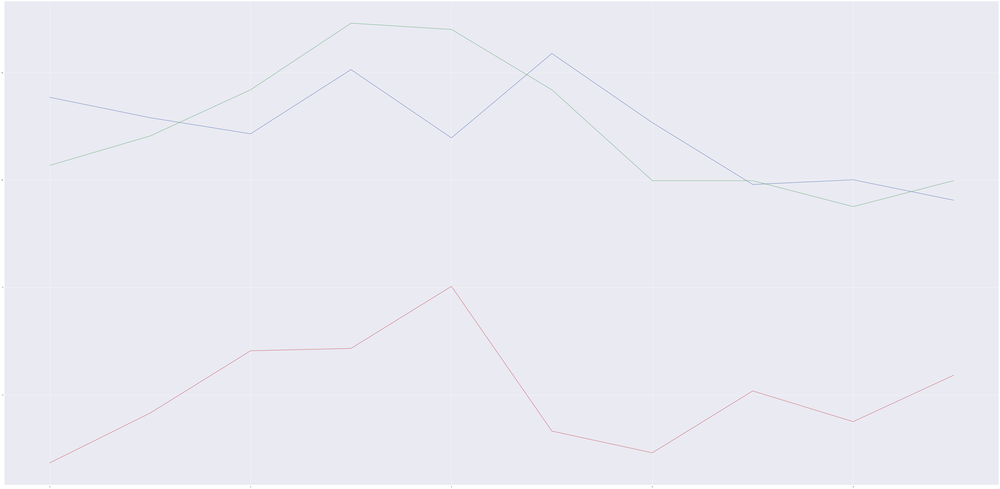

In [38]:
plt.figure(figsize = (100,50))
plt.plot(y_test)
plt.plot(y_pred)
plt.plot(y_pred-y_test)

# XGBOOST

In [87]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.model_selection import GridSearchCV

In [103]:
hour_12_6

<function __main__.hour_12_6(df_basel, df)>

MAE: 2.016010194301605
MSE: 6.118205555191499
RMSE: 2.4735006681202854
.R2 0.1331352003034021


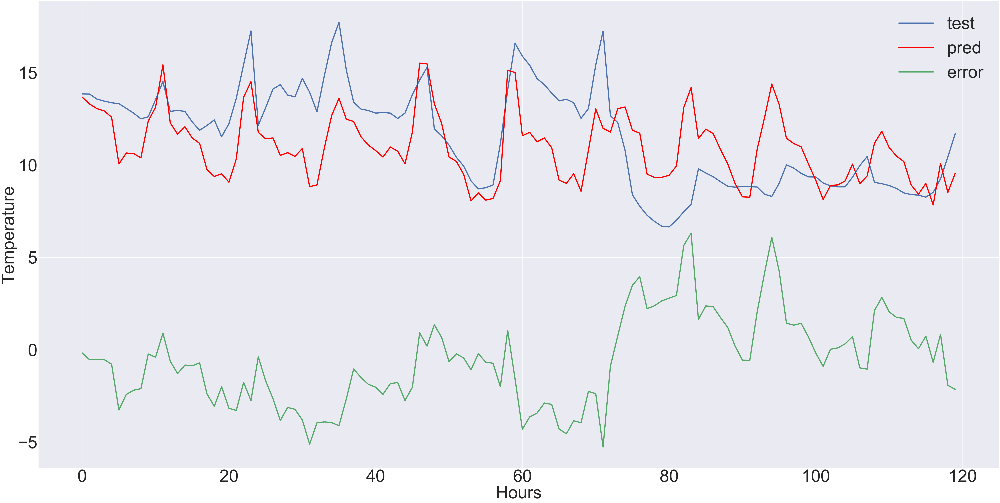

MAE: 2.0164769090016685
MSE: 7.125343758538833
RMSE: 2.669333954105187
.R2 0.5454301015787284


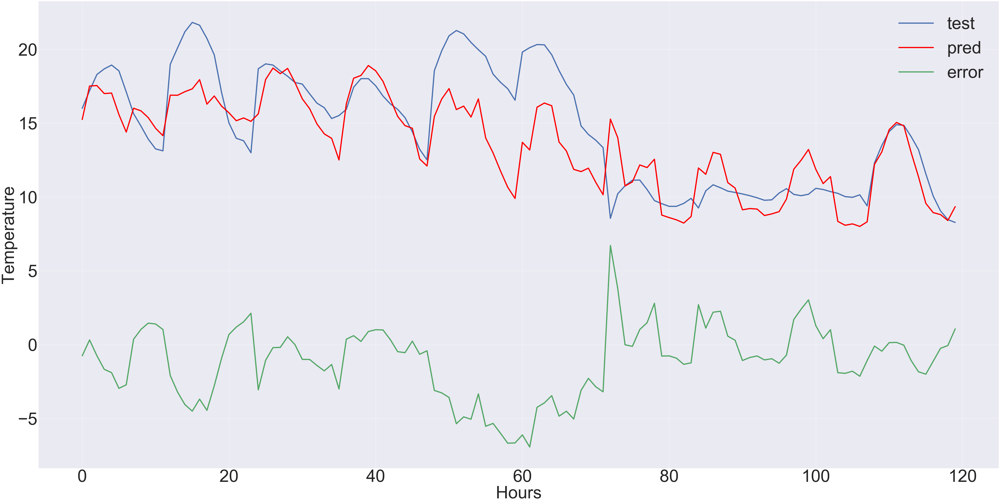

In [95]:
mean=[]
game=[]
for i in range(2):
    train=resampling_A_B(day=92,data=data[i])   
    X_train,y_train=train[0:19752,:279], train[:19752,279]
    X_test, y_test=train[19752:,:279], train[19752:,279]
   # X_train,y_train=data[i].iloc[0:6246,:4].values, data[i].iloc[:6246,5].values
   # X_test, y_test=data[i].iloc[6246:,:4].values, data[i].iloc[6246:,5].values
    params = {
    'min_child_weight': [4, 5],
    'gamma': [i / 10.0 for i in range(3, 6)],
    'subsample': [i / 10.0 for i in range(6, 11)],
    'colsample_bytree': [i / 10.0 for i in range(6, 11)],
    'max_depth': [2, 3, 4]
}
# Initialize XGB and GridSearch
    xgb_reg = xgb.XGBRegressor(nthread=-1, objective='reg:squarederror')
    grid = GridSearchCV(xgb_reg, params)
    grid.fit(X_train, y_train)
    gridcv_xgb = grid.best_estimator_
    print(r2_score(y_test, gridcv_xgb.predict(X_test)))
    reg=xgb.XGBRegressor(n_estimators=1000)
    reg.fit(X_train, y_train)
    y_pred=reg.predict(X_test)
    print('MAE:', metrics.mean_absolute_error(y_test, reg.predict(X_test)))
    print('MSE:', metrics.mean_squared_error(y_test, reg.predict(X_test)))
    print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, reg.predict(X_test))))
    print('.R2', metrics.r2_score(y_test,y_pred))
    plt.figure(figsize = (100,50))
    plt.plot(y_test,label='test',linewidth=7.0)
    plt.plot(y_pred, label='pred',linewidth=7.0, color='r')
    plt.plot(y_pred-y_test,label="error",linewidth=7.0)
    plt.legend(loc="upper left")
    plt.xlabel('Hours', fontsize=100)
    plt.ylabel('Temperature',fontsize=100)
    plt.legend(fontsize=100)
    plt.xticks(size = 100)
    plt.yticks(size = 100)
    error=y_pred-y_test
    mean.append(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    game.append(metrics.mean_absolute_error(y_test,y_pred))
    plt.show()

In [ ]:
mean=np.array(mean)
np.sqrt(sum((mean**2)/len(mean)))

In [ ]:
game=np.array(game)
np.sqrt(sum((game**2)/len(game)))


In [ ]:
plt.rcParams["figure.figsize"] = (14,8)
xgb.plot_importance(booster=reg, max_num_features=30)

In [184]:
data[0]

,Year,Month,Day,Hour,Minute,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalPrecipationhigh,TotalPrecipationlow,...,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust,Temperature_shift,mean_temp,std,mean_4
10536,1986,5,1,0,0,8.05,100.0,1023.9,NaN,0.0,...,34.94,14.57,41.53,43.23,73.71,15.84,-0.04,11.529042,4.172098,7.936308
10537,1986,5,1,1,0,7.97,99.0,1023.4,NaN,0.0,...,36.54,14.99,41.86,43.79,78.99,16.56,-0.08,11.542792,4.104919,7.941167
10538,1986,5,1,2,0,7.93,99.0,1023.1,NaN,0.0,...,37.37,14.84,44.16,43.65,83.24,23.40,-0.04,11.553417,3.940938,7.945975
10539,1986,5,1,3,0,7.83,100.0,1022.6,NaN,0.0,...,39.13,14.30,46.32,43.47,85.70,15.84,-0.10,11.563625,3.624855,7.950658
10540,1986,5,1,4,0,7.69,100.0,1022.4,NaN,0.0,...,42.61,13.52,47.68,43.76,87.49,15.48,-0.14,11.573083,3.122373,7.955150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304219,2019,10,31,19,0,11.57,83.0,1017.8,0.0,0.0,...,53.13,10.74,103.57,8.59,146.98,5.04,-1.64,13.233833,2.156686,15.485958
304220,2019,10,31,20,0,10.07,89.0,1018.0,0.0,0.0,...,90.00,10.31,114.78,8.85,153.43,12.96,-1.50,13.210292,1.938750,15.478175
304221,2019,10,31,21,0,9.06,91.0,1018.6,0.0,0.0,...,161.57,7.39,133.03,8.56,165.38,15.48,-1.01,13.183542,1.968490,15.470192
304222,2019,10,31,22,0,8.47,89.0,1018.2,0.0,0.0,...,191.31,5.48,156.80,8.31,184.97,14.76,-0.59,13.158917,2.222633,15.462742


In [175]:
xgb.importance(model = )

AttributeError: module 'xgboost' has no attribute 'importance'

In [172]:
np.sqrt(sum((game**2)/len(game)))

0.7891335582733155

In [179]:
train

array([[1986.  ,    5.  ,    1.  , ...,    1.  ,    0.  ,   10.68],
       [1986.  ,    5.  ,    1.  , ...,    1.  ,    1.  ,    9.77],
       [1986.  ,    5.  ,    1.  , ...,    1.  ,    2.  ,    8.92],
       ...,
       [1994.  ,   10.  ,   31.  , ...,   31.  ,   21.  ,    9.06],
       [1994.  ,   10.  ,   31.  , ...,   31.  ,   22.  ,    8.47],
       [1994.  ,   10.  ,   31.  , ...,   31.  ,   23.  ,    8.28]])

# SVR

In [8]:
from sklearn.svm import SVR

In [ ]:
for k in ['linear','poly','rbf','sigmoid']:
    clf=sklearn.svm.SVR(kernel=k)
    clf.fit(X_train, y_train)
    confidence=clf.score(X_train, y_train)
    print(k,confidence)

In [30]:
Svr=sklearn.svm.SVR(kernel='rbf')
Svr.fit(X_train, y_train)
y_pred=Svr.predict(X_test)
print(Svr.score(X_train,y_train))

0.003186490426383637


In [31]:
error=np.sqrt(metrics.mean_squared_error(y_test,Svr.predict(X_test)))
print('RMSE value of the SVR Model is:', error)

RMSE value of the SVR Model is: 4.009252932617702


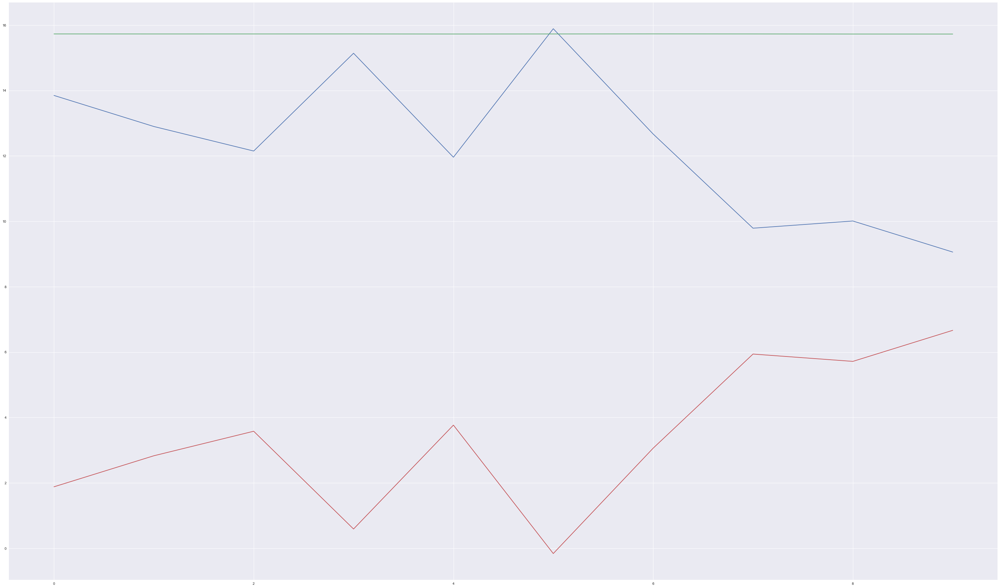

In [32]:
plt.figure(figsize = (50,30))
plt.plot(y_test)
plt.plot(y_pred)
plt.plot(y_pred-y_test)

# NEURAL_NETWORK

In [11]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.layers import GRU
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling1D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau
from tensorflow.keras.layers import RepeatVector
from deepstack.ensemble import StackEnsemble
np.set_printoptions(suppress=True)

from tensorflow import keras
import os
from deepstack.base import KerasMember

Using TensorFlow backend.


In [12]:
data=hour_24(df_basel=df_basel,df=df)

In [13]:
data[15]

,Year,Month,Day,Hour,Minute,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalPrecipationhigh,TotalPrecipationlow,...,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust,Temperature_shift,mean_temp,std,mean_4
10551,1986,5,1,15,0,19.65,73.0,1018.3,NaN,0.0,...,87.00,35.63,91.47,39.31,87.60,25.92,0.32,11.662458,4.627053,8.027308
10575,1986,5,2,15,0,24.59,68.0,1012.8,NaN,0.1,...,225.57,3.56,213.37,2.39,219.24,3.60,-0.39,12.092375,7.048245,8.247933
10599,1986,5,3,15,0,19.27,70.0,1010.2,NaN,0.2,...,351.05,8.87,335.59,10.09,351.39,10.44,-2.02,12.801000,7.225093,8.436950
10623,1986,5,4,15,0,16.69,71.0,1012.2,NaN,0.0,...,76.69,16.71,80.77,23.00,79.14,23.76,-1.01,13.091417,2.358557,8.613942
10647,1986,5,5,15,0,21.90,54.0,1010.5,NaN,0.0,...,20.02,4.52,352.48,5.69,3.45,10.44,-0.42,13.198917,7.752017,8.771783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
304119,2019,10,27,15,0,20.31,57.0,1019.6,0.0,0.0,...,294.23,17.40,294.44,22.35,284.93,21.96,-0.02,15.547000,3.235691,15.880733
304143,2019,10,28,15,0,11.14,87.0,1019.0,0.0,0.0,...,355.24,8.71,352.87,9.50,127.30,8.28,0.38,15.032667,1.616252,15.822350
304167,2019,10,29,15,0,10.63,85.0,1020.4,0.0,0.0,...,5.71,7.59,354.56,19.42,100.68,10.44,-0.20,14.486292,0.869660,15.750150
304191,2019,10,30,15,0,10.19,80.0,1022.2,0.0,0.1,...,132.40,13.78,130.76,25.15,103.24,19.44,0.10,13.867083,0.669239,15.636433


In [14]:
df

,Year,Month,Day,Hour,Minute,Temperature,RelativeHumidity,MeanSeaLevelPressure,TotalPrecipationhigh,TotalPrecipationlow,...,WindDirection10,WindSpeed80,WindDirection80,WindSpeed900,WindDirection900,WindGust,Temperature_shift,mean_temp,std,mean_4
8760,1986,2,16,0,0,1.84,94.0,1009.2,NaN,0.0,...,184.42,3.96,198.81,7.19,259.48,5.40,0.03,-3.584750,0.820344,0.921383
8761,1986,2,16,1,0,1.85,94.0,1009.2,NaN,0.0,...,175.65,3.61,194.99,7.12,263.75,5.40,0.01,-3.574292,0.862402,0.918908
8762,1986,2,16,2,0,1.84,95.0,1009.1,NaN,0.0,...,159.04,3.54,189.63,6.35,265.43,5.04,-0.01,-3.563125,0.852606,0.916442
8763,1986,2,16,3,0,2.04,97.0,1009.0,NaN,0.0,...,138.69,3.23,178.38,5.98,265.14,5.04,0.20,-3.550792,0.731463,0.914192
8764,1986,2,16,4,0,2.10,95.0,1008.6,NaN,0.0,...,124.05,2.94,157.65,5.22,267.39,4.68,0.06,-3.537875,0.535664,0.912108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306979,2020,2,23,19,0,14.16,53.0,1024.9,0.0,0.0,...,257.40,42.09,257.15,80.46,266.15,53.28,-0.88,8.557583,1.876304,6.575925
306980,2020,2,23,20,0,13.72,54.0,1025.3,0.0,0.0,...,260.22,41.61,260.54,82.80,269.75,50.40,-0.44,8.579292,1.384429,6.584517
306981,2020,2,23,21,0,13.01,61.0,1026.7,0.0,0.0,...,258.94,41.73,259.56,79.63,272.33,47.88,-0.71,8.601250,0.998666,6.592917
306982,2020,2,23,22,0,12.60,64.0,1026.9,0.0,0.0,...,258.31,41.87,258.59,73.22,278.77,42.84,-0.41,8.622542,0.993629,6.601367


In [15]:
#data=hour_12(df_basel=df_basel,df=df)

In [16]:
data[15].reset_index(inplace=True)

In [17]:
df.columns

Index(['Year', 'Month', 'Day', 'Hour', 'Minute', 'Temperature',
       'RelativeHumidity', 'MeanSeaLevelPressure', 'TotalPrecipationhigh',
       'TotalPrecipationlow', 'SnowfallAmounthigh', 'SnowfallAmountlow',
       'TotalCloudCover', 'HighCloudCover', 'MediumCloudCover',
       'LowCloudCover', 'SunshineDuration', 'ShortwaveRadiation',
       'WindSpeed10', 'WindDirection10', 'WindSpeed80', 'WindDirection80',
       'WindSpeed900', 'WindDirection900', 'WindGust', 'Temperature_shift',
       'mean_temp', 'std', 'mean_4'],
      dtype='object')

In [18]:
len(data[7])

6256

In [19]:
data[15].reset_index(inplace=True)

In [20]:
data_train=data[15].loc[:6000,['Temperature','Month','Day','mean_temp','std','mean_4']]

In [21]:
data_test=data[15].loc[6000:,['Temperature','Month','Day','mean_temp','std','mean_4']]

In [22]:
data_train=data_train.values
data_test=data_test.values

In [23]:
np.isnan(data_train.values).any()

AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [24]:
data_train

array([[19.65      ,  5.        ,  1.        , 11.66245833,  4.62705253,
         8.02730833],
       [24.59      ,  5.        ,  2.        , 12.092375  ,  7.04824473,
         8.24793333],
       [19.27      ,  5.        ,  3.        , 12.801     ,  7.22509306,
         8.43695   ],
       ...,
       [29.13      ,  8.        , 19.        , 21.69225   ,  4.25963578,
        23.32605833],
       [29.43      ,  8.        , 20.        , 22.08233333,  4.06106   ,
        23.33655833],
       [29.87      ,  8.        , 21.        , 22.48808333,  4.55580574,
        23.36585   ]])

In [853]:
data_train.shape

(6001, 6)

In [854]:
data_test.shape

(256, 6)

In [25]:
X_train, y_train = [],[]


In [26]:
for i in range (80,len(data_train)-80):
        X_train.append(data_train[i-80:i,:])
        y_train.append(data_train[i:i+10,:1])

# Prepare data

In [27]:
X_train=np.array(X_train)

In [28]:
y_train=np.array(y_train)

In [29]:
X_train.shape

(5841, 80, 6)

In [30]:
X_train=X_train.reshape(5841, 480)

In [31]:
y_train.shape

(5841, 10, 1)

In [32]:
y_train.shape

(5841, 10, 1)

In [33]:
len(X_train)

5841

In [34]:
X_val=X_train[5500:]
X_train=X_train[:5500]


In [35]:
Y_val=y_train[5500:]
y_train=y_train[:5500]


In [36]:
#X_val.shape[0]+ X_train.shape[0]

In [37]:
X_val.shape

(341, 480)

In [38]:
Y_val.shape

(341, 10, 1)

In [39]:
y_train.shape

(5500, 10, 1)

In [40]:
X_train.shape

(5500, 480)

In [41]:
y_train=y_train.reshape(5500, 10)
X_train=X_train.reshape(5500, 480)
Y_val=Y_val.reshape(341, 10)
X_val=X_val.reshape(341, 480)

In [42]:
Y_val.shape

(341, 10)

In [43]:
X_train.shape

(5500, 480)

In [44]:
x_scaler=MinMaxScaler()
X_train=x_scaler.fit_transform(X_train)
X_val=x_scaler.fit_transform(X_val)

In [45]:
y_scaler= MinMaxScaler()
y_train = y_scaler.fit_transform(y_train)
Y_val=y_scaler.fit_transform(Y_val)

In [46]:
X_train=X_train.reshape(5500, 480)
y_train=y_train.reshape(5500, 10)

In [47]:
X_train.shape


(5500, 480)

In [48]:
y_train.shape

(5500, 10)

In [49]:
X_val=X_val.reshape(341,480)
Y_val=Y_val.reshape(341, 10)

In [50]:
X_val.shape, Y_val.shape

((341, 480), (341, 10))

## CNN-LSTM

In [52]:
reg= Sequential()

In [257]:
reg.add(Conv1D(filters=32, kernel_size=5, activation='relu', input_shape=(80, 10)))
reg.add(MaxPooling1D(pool_size=2))
reg.add(Flatten())
reg.add(RepeatVector(10))
reg.add(LSTM(200, activation='relu', return_sequences=True))
reg.add(TimeDistributed(Dense(100, activation='relu')))
reg.add(TimeDistributed(Dense(1)))

# Encoder-Decoder

In [767]:
reg.add(LSTM(300, activation='relu', input_shape=(80, 6)))
reg.add(RepeatVector(10))
reg.add(TimeDistributed(Dense(300, activation='relu')))
reg.add(TimeDistributed(Dense(1)))
#reg.add(Dense(100, activation='relu'))
#reg.add(Dense(10))

# CNN-Perceptron

In [736]:

reg.add(Conv1D(filters=256, kernel_size=5, activation='relu', input_shape=(80, 6)))
reg.add(MaxPooling1D(pool_size=3))
reg.add(Flatten())
reg.add(Dense(300, activation='relu', input_shape=(480,)))
reg.add(Dense(300))
reg.add(Dense(300, activation='relu'))
reg.add(Dense(10))

#reg.add(Dense(500))


#reg.add(Dense(100))

# Perceptron


In [53]:
reg.add(Dense(300, activation='relu', input_shape=(480,)))
reg.add(Dense(300))
reg.add(Dense(300, activation='relu'))
reg.add(Dense(10))


In [54]:
reg.compile(optimizer=tf.keras.optimizers.RMSprop(clipvalue=1.0), loss='mae', metrics=['mae'])

In [55]:
reg.compile(loss='mse',optimizer='Adam', metrics=['mae'])

In [56]:
X_train.shape, y_train.shape

((5500, 480), (5500, 10))

In [57]:
path_checkpoint = '23_checkpoint.keras'
callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                      monitor='val_loss',
                                      verbose=1,
                                      save_weights_only=True,
                                      save_best_only=True)

In [58]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, mode='auto')

In [59]:
history=reg.fit(X_train,y_train,epochs=50, validation_data=(X_val,Y_val),callbacks=[early_stopping,callback_checkpoint])

Train on 5500 samples, validate on 341 samples
Epoch 1/50
4832/5500 [=========================>....] - ETA: 0s - loss: 0.0275 - mae: 0.1238
Epoch 00001: val_loss improved from inf to 0.04050, saving model to 23_checkpoint.keras
5500/5500 [==============================] - 1s 184us/sample - loss: 0.0262 - mae: 0.1217 - val_loss: 0.0405 - val_mae: 0.1624
Epoch 2/50
5248/5500 [===========================>..] - ETA: 0s - loss: 0.0165 - mae: 0.1046
Epoch 00002: val_loss improved from 0.04050 to 0.03574, saving model to 23_checkpoint.keras
5500/5500 [==============================] - 0s 65us/sample - loss: 0.0165 - mae: 0.1047 - val_loss: 0.0357 - val_mae: 0.1544
Epoch 3/50
5312/5500 [===========================>..] - ETA: 0s - loss: 0.0162 - mae: 0.1036
Epoch 00003: val_loss did not improve from 0.03574
5500/5500 [==============================] - 0s 61us/sample - loss: 0.0161 - mae: 0.1034 - val_loss: 0.0418 - val_mae: 0.1642
Epoch 4/50
5216/5500 [===========================>..] - ETA: 0s 

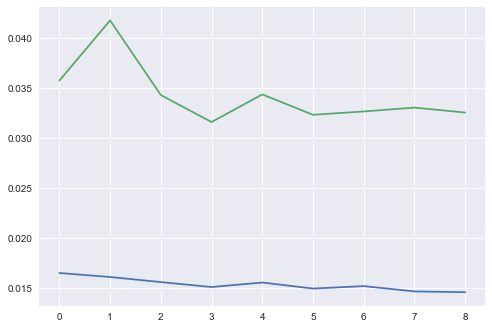

In [60]:
plt.plot(history.history['loss'][1:])
plt.plot(history.history['val_loss'][1:])

In [61]:
reg.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 300)               144300    
_________________________________________________________________
dense_1 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_2 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_3 (Dense)              (None, 10)                3010      
Total params: 327,910
Trainable params: 327,910
Non-trainable params: 0
_________________________________________________________________


In [62]:
data_test=np.array(data_test)

In [63]:
data_test.shape

(256, 6)

In [64]:
X_test, y_test = [],[]

for i in range (80,len(data_test)-80):
        X_test.append(data_test[i-80:i,:])
        y_test.append(data_test[i:i+10,:1])

In [65]:
X_test=np.array(X_test)

In [66]:
X_test.shape

(96, 80, 6)

In [67]:
X_test=X_test.reshape(96, 480 )

In [68]:
y_test=np.array(y_test)

In [69]:
y_test.shape

(96, 10, 1)

In [70]:
y_test=y_test.reshape(96, 10)

In [71]:
X_test=x_scaler.transform(X_test)
y_test=y_scaler.transform(y_test)

In [72]:
X_test=X_test.reshape(96, 480 )

In [73]:
#y_test=y_test.reshape(1056, 60)

In [74]:
y_pred=reg.predict(X_test)

In [75]:
y_pred=y_pred.reshape(96, 10)

In [76]:
y_pred=y_scaler.inverse_transform(y_pred)

In [77]:

y_pred

array([[17.108583, 19.255505, 17.780579, 18.118301, 18.00518 , 18.379383,
        18.609264, 19.200453, 18.751972, 19.238117],
       [17.50255 , 19.256758, 18.73652 , 19.089787, 18.994516, 19.439053,
        20.044582, 20.491697, 20.333233, 20.47734 ],
       [18.346117, 19.59294 , 18.084833, 18.086874, 17.730104, 17.829857,
        18.688585, 19.465715, 18.753502, 19.232948],
       [15.585923, 17.088564, 17.83149 , 18.407505, 17.710415, 19.401937,
        19.571623, 20.533318, 19.959528, 21.196266],
       [16.720966, 17.575718, 17.885534, 18.723959, 18.974955, 19.590506,
        20.335882, 20.457901, 20.297268, 20.852083],
       [19.174738, 19.915262, 18.805777, 18.699316, 18.545254, 19.011003,
        19.833925, 19.650837, 19.19281 , 18.955761],
       [18.499903, 19.266888, 19.01945 , 19.044935, 18.952524, 19.275787,
        19.571058, 19.837925, 19.774126, 19.407015],
       [19.968006, 20.601824, 19.281551, 19.53847 , 18.826757, 18.32087 ,
        19.28124 , 19.508102, 19.6447

In [78]:
y_true=y_scaler.inverse_transform(y_test)

In [79]:
y_true

array([[14.1 , 16.69, 13.81, 14.2 , 17.08, 15.37, 15.91, 15.69, 18.64,
        17.87],
       [16.69, 13.81, 14.2 , 17.08, 15.37, 15.91, 15.69, 18.64, 17.87,
        16.16],
       [13.81, 14.2 , 17.08, 15.37, 15.91, 15.69, 18.64, 17.87, 16.16,
        14.64],
       [14.2 , 17.08, 15.37, 15.91, 15.69, 18.64, 17.87, 16.16, 14.64,
        16.35],
       [17.08, 15.37, 15.91, 15.69, 18.64, 17.87, 16.16, 14.64, 16.35,
        20.01],
       [15.37, 15.91, 15.69, 18.64, 17.87, 16.16, 14.64, 16.35, 20.01,
        21.56],
       [15.91, 15.69, 18.64, 17.87, 16.16, 14.64, 16.35, 20.01, 21.56,
        23.35],
       [15.69, 18.64, 17.87, 16.16, 14.64, 16.35, 20.01, 21.56, 23.35,
        18.62],
       [18.64, 17.87, 16.16, 14.64, 16.35, 20.01, 21.56, 23.35, 18.62,
        21.95],
       [17.87, 16.16, 14.64, 16.35, 20.01, 21.56, 23.35, 18.62, 21.95,
        20.32],
       [16.16, 14.64, 16.35, 20.01, 21.56, 23.35, 18.62, 21.95, 20.32,
        13.69],
       [14.64, 16.35, 20.01, 21.56, 23.35, 

In [80]:
error=[]
game=[]
for i in range(y_true.shape[1]):
    print('.Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_true[i], y_pred[i])))
    error.append(np.sqrt(metrics.mean_squared_error(y_true[i], y_pred[i])))
    print('.Mean Absolute Error:', metrics.mean_absolute_error(y_true[i],y_pred[i]))
    game.append(metrics.mean_absolute_error(y_true[i],y_pred[i])) 

.Root Mean Squared Error: 2.795673503853889
.Mean Absolute Error: 2.508733810424805
.Root Mean Squared Error: 3.5726197477040684
.Mean Absolute Error: 3.2946037368774412
.Root Mean Squared Error: 3.1034353347414765
.Mean Absolute Error: 2.644147575378418
.Root Mean Squared Error: 3.044421854106197
.Mean Absolute Error: 2.5376568641662596
.Root Mean Squared Error: 2.9790949262286484
.Mean Absolute Error: 2.4412839355468745
.Root Mean Squared Error: 3.068161849362521
.Mean Absolute Error: 2.6427541198730466
.Root Mean Squared Error: 2.8187975380624226
.Mean Absolute Error: 2.427147880554199
.Root Mean Squared Error: 2.7635873589582127
.Mean Absolute Error: 2.4639754486083985
.Root Mean Squared Error: 2.7272851208427893
.Mean Absolute Error: 2.459491142272949
.Root Mean Squared Error: 2.966294732551023
.Mean Absolute Error: 2.7049227523803703


In [81]:
error=np.array(error)
np.sqrt(sum((error**2)/len(error)))

2.993123192249074

In [82]:
game=np.array(game)
np.sqrt(sum((game**2)/len(game)))

2.6239535073624696

In [83]:
game

array([2.50873381, 3.29460374, 2.64414758, 2.53765686, 2.44128394,
       2.64275412, 2.42714788, 2.46397545, 2.45949114, 2.70492275])

In [84]:
error

array([2.7956735 , 3.57261975, 3.10343533, 3.04442185, 2.97909493,
       3.06816185, 2.81879754, 2.76358736, 2.72728512, 2.96629473])

In [85]:
np.std(y_true[0])

1.5561246736685337

(array([-10.,  -5.,   0.,   5.,  10.,  15.,  20.,  25.]),
 <a list of 8 Text yticklabel objects>)

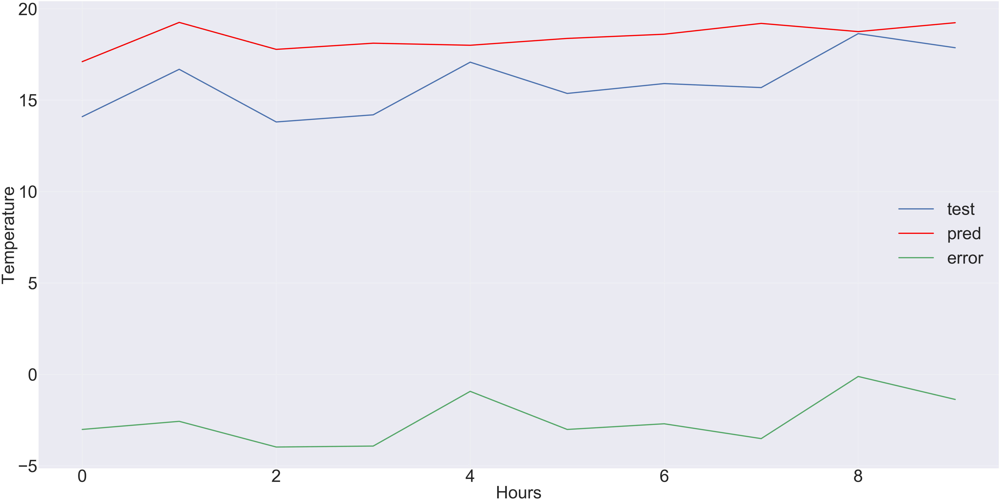

In [86]:

plt.figure(figsize = (100,50))
plt.plot(y_true[0],label='test',linewidth=7.0)
plt.plot(y_pred[0], label='pred',linewidth=7.0, color='r')
plt.plot(y_true[0]-y_pred[0],label="error",linewidth=7.0)
plt.legend(loc="upper left") 
plt.xlabel('Hours', fontsize=100)
plt.ylabel('Temperature',fontsize=100)
plt.legend(fontsize=100)
plt.xticks(size = 100)
plt.yticks(size = 100)

In [ ]:
print('.Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))